## K-Neighbors Classifier

To see if using a simple classifier would work, I decided to use a K-Neighbors Classifier that uses a sample's nearest neighbours to predict a sample. I initially decided to test it on the darvish dataset with default settings, which means it will decide which tree to use out of Ball and KD; it will also weight all points equally.

{'ST', 'FF', 'FS', 'SI', 'FC', 'CH', 'CS', 'SL', 'CU', 'KC'}


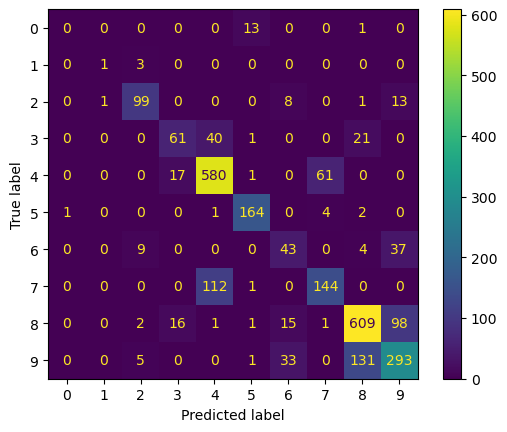

ACCURACY - 75.24528301886792% of samples accurately predicted


In [80]:
model2 = neighbors.KNeighborsClassifier(n_neighbors=5)
model2.fit(darvishTrainX,darvishTrainY)
darvishTestYPred = model2.predict(darvishTestX)
print(set(darvishTestYPred))
printMetrics(darvishTestYAct,darvishTestYPred)

This model is fairly accurate at predicting pitches, however it depends on the type of pitch. Some pitches with close pitch signatures are mistaken for each other, whilst some cannot be predicted at all, due to overlaps or small sample sizes.

In [84]:
model2.score(darvishTestX,darvishTestYAct)*100

75.24528301886792

sklearn's K-Neighbors classifier has a score parameter that provides the same function as sklearn's accuracy metric used in our printMetrics function.

In [85]:
coleTrainX, coleTestX, coleTrainY, coleTestYAct = getData(cole,['spin_axis','release_spin_rate'],'pitch_type',0.25)


In [86]:
coleTrainX

,spin_axis,release_spin_rate
337,222.0,2555.0
3094,86.0,2700.0
2188,214.0,2543.0
1578,121.0,2551.0
3091,235.0,1750.0
...,...,...
3005,215.0,2384.0
3777,38.0,3004.0
93,143.0,2609.0
1967,214.0,2535.0


## Mean Shift

Mean Shift tries to find higher density sections in an area of uniform density. All points will be assigned to a cluster depending on the cluster allocation of nearby points.

In [87]:
model3 = cluster.MeanShift()
model3.fit(coleTrainX)
model3ClusterLabels = model3.fit_predict(coleTrainX)

In [88]:
model3ClusterLabels

array([0, 0, 0, ..., 0, 0, 0])

In [89]:
set(model3ClusterLabels)

{0, 1, 2}

In [90]:
model3Pred = model3.predict(coleTestX)
print(model3Pred)
print(set(model3Pred))

[0 0 0 0 0 0 0 1 0 0 2 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 2 0 0
 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 2 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 2 0 0 0 1
 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0
 0 2 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 2 0 1
 1 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 2 0 0 0 0 0
 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 2 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 2 0 0 0 0
 2 0 0 0 0 0 0 0 0 0 0 0 

We can see Mean Shift has decided to arrange our dataset into 3 clusters.

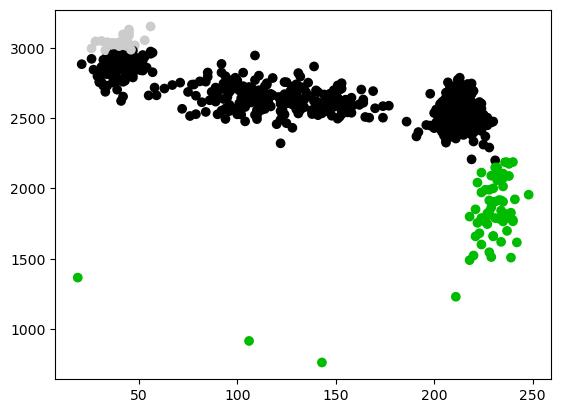

In [93]:
plt.scatter(coleTestX['spin_axis'],coleTestX['release_spin_rate'],c=model3Pred,cmap='nipy_spectral')
plt.show()

When plotting spin rate against spin axis, Mean Shift was able to identify one of the clusters, however, it merged two others and split a third.

In [94]:
coleTrainX2, coleTestX2, coleTrainY2, coleTestYAct2 = getData(cole,['release_speed','release_spin_rate'],'pitch_type',0.25)


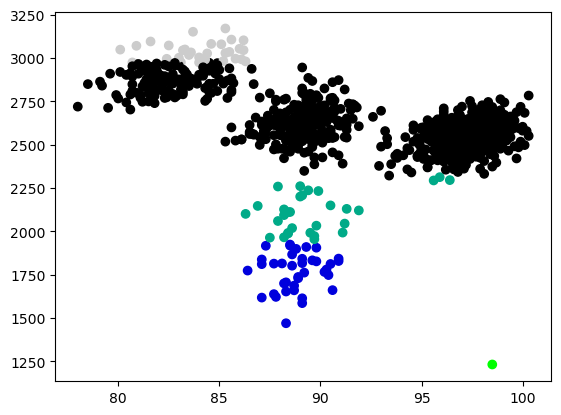

In [95]:
model4 = cluster.MeanShift()
model4.fit(coleTrainX2)
model4ClusterLabels = model4.fit_predict(coleTrainX2)
model4Pred = model4.predict(coleTestX2)

plt.scatter(coleTestX2['release_speed'],coleTestX2['release_spin_rate'],c=model4Pred,cmap='nipy_spectral')
plt.show()

When plotting spin rate against speed, Mean Shift 'striped' the clusters - splitting them in the middle with a line.

[[  95.09686536 2558.6942446 ]
 [  88.52211538 1781.32692308]
 [  88.82142857 2077.38571429]
 [  90.8         917.        ]
 [  90.7         764.        ]
 [  87.         3387.        ]]


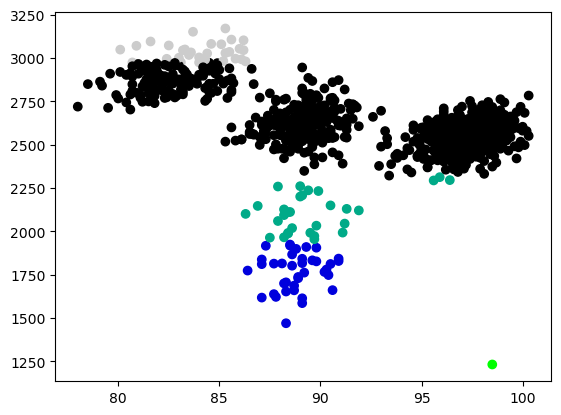

In [96]:
model4 = cluster.MeanShift(cluster_all=False)
model4.fit(coleTrainX2)
model4ClusterLabels = model4.fit_predict(coleTrainX2)
print(model4.cluster_centers_)
model4Pred = model4.predict(coleTestX2)

plt.scatter(coleTestX2['release_speed'],coleTestX2['release_spin_rate'],c=model4Pred,cmap='nipy_spectral')
plt.show()

Changing cluster_all to false (points do not need not be assigned to a cluster) changed nothing as the graph looks virtually identical to the one above

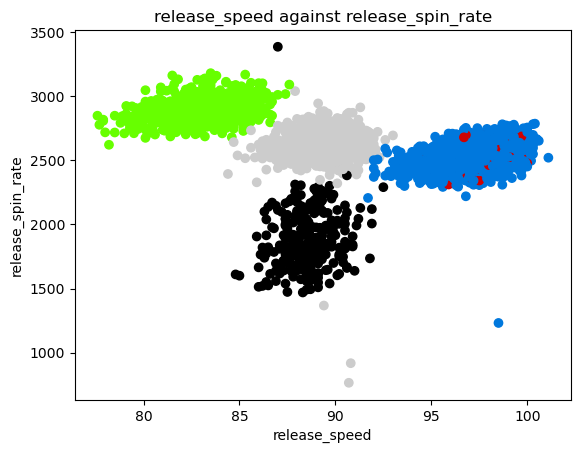

In [19]:
createPlot(cole,'release_speed','release_spin_rate')

For comparison, here is the actual graph. A good clustering algorithm for this problem would reuturn a result similar to this.

## Agglomerative Clustering

Agglomerative Clustering is part of the Hierarchical Clustering family, that build up clusters one at a time. Agglomerative Clustering does this recursively, where every sample starts in its own cluster before merged into a larger cluster.

We will test this method by using the cole dataset.

In [99]:
print(set(coleTrainY2.to_numpy()))
model5 = cluster.AgglomerativeClustering(n_clusters=len(set(coleTrainY2.to_numpy())))
model5.fit(coleTrainX2)

model5ClusterLabels = model5.fit_predict(coleTestX2)

{'FF', 'SI', 'CH', 'SL', 'KC'}


We will start by using 5 clusters, because that is how many pitch types are in the cole dataset. Additionally, we will use ward linkage, because that is the default; it will seek to minimize the variance of the merging clusters.

In [100]:
model5ClusterLabels

array([2, 0, 2, 3, 3, 0, 3, 3, 0, 3, 3, 3, 3, 3, 2, 3, 3, 2, 3, 2, 0, 2,
       3, 3, 0, 2, 0, 0, 3, 0, 2, 0, 3, 2, 3, 2, 2, 3, 0, 2, 2, 0, 0, 2,
       0, 2, 2, 2, 3, 1, 0, 3, 3, 3, 3, 2, 2, 0, 0, 3, 2, 1, 4, 0, 2, 2,
       2, 0, 2, 0, 0, 3, 2, 3, 3, 3, 3, 2, 3, 2, 0, 3, 4, 3, 3, 3, 3, 3,
       2, 3, 2, 2, 0, 0, 3, 2, 0, 2, 3, 4, 3, 0, 2, 3, 3, 2, 0, 3, 2, 2,
       2, 2, 2, 0, 3, 2, 3, 2, 3, 2, 3, 2, 3, 2, 0, 3, 2, 2, 2, 3, 3, 0,
       0, 1, 2, 3, 2, 2, 2, 3, 2, 2, 3, 3, 0, 2, 2, 3, 2, 0, 2, 2, 2, 1,
       2, 3, 3, 2, 1, 3, 0, 2, 0, 2, 1, 3, 3, 1, 3, 4, 3, 0, 3, 2, 2, 0,
       3, 3, 3, 3, 3, 0, 2, 0, 0, 2, 3, 0, 3, 3, 3, 2, 0, 2, 2, 2, 3, 3,
       2, 3, 3, 2, 3, 2, 3, 1, 3, 2, 2, 2, 2, 3, 0, 1, 2, 0, 3, 3, 2, 3,
       3, 0, 0, 2, 0, 2, 3, 2, 1, 3, 2, 1, 0, 2, 0, 1, 3, 2, 3, 2, 2, 3,
       3, 2, 3, 3, 2, 2, 3, 0, 3, 0, 3, 3, 2, 3, 3, 2, 0, 3, 2, 3, 2, 0,
       3, 2, 3, 0, 2, 4, 4, 2, 3, 0, 2, 3, 3, 0, 1, 0, 2, 2, 1, 3, 3, 2,
       3, 3, 3, 0, 2, 0, 3, 2, 0, 2, 1, 1, 3, 0, 2,

*Cluster labels from the training set*

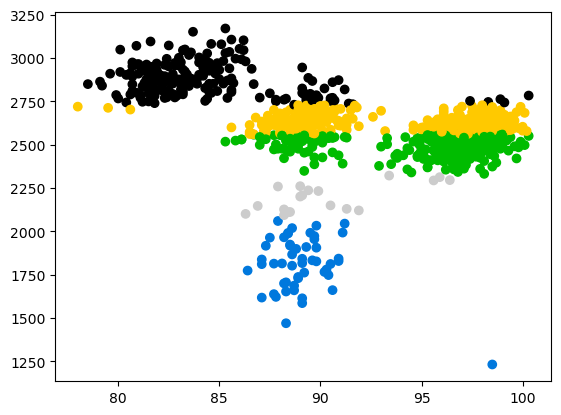

In [101]:
plt.scatter(coleTestX2['release_speed'],coleTestX2['release_spin_rate'],c=model5ClusterLabels,cmap='nipy_spectral')
plt.show()

The clustering model perfomed rather poorly, as clusters are being formed in stripes across the dataset. We should investigate other linkage methods.

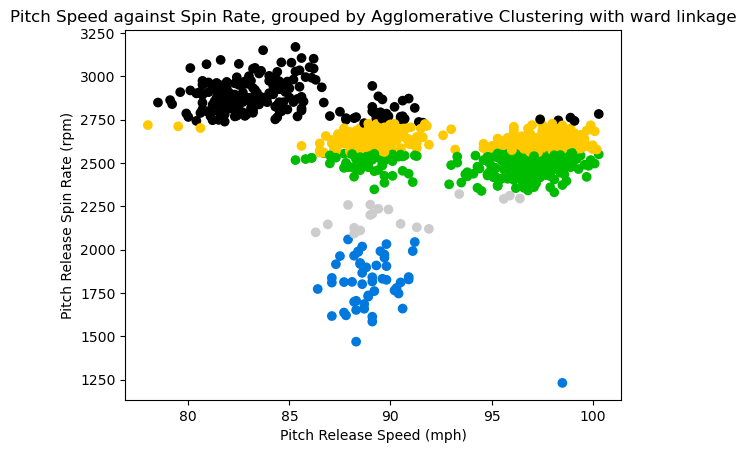

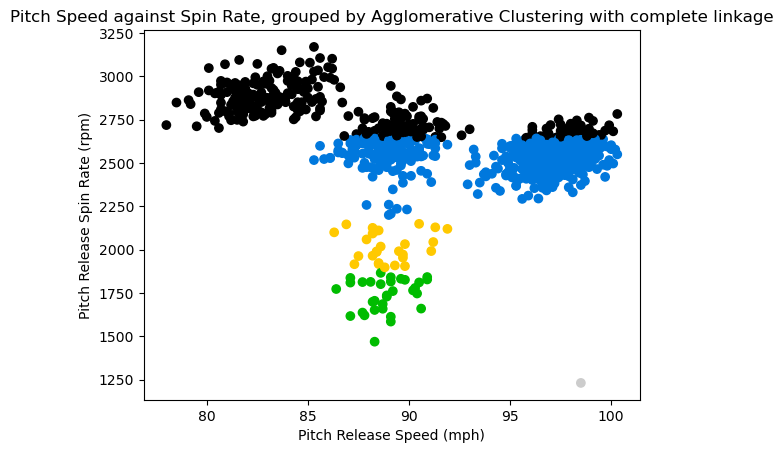

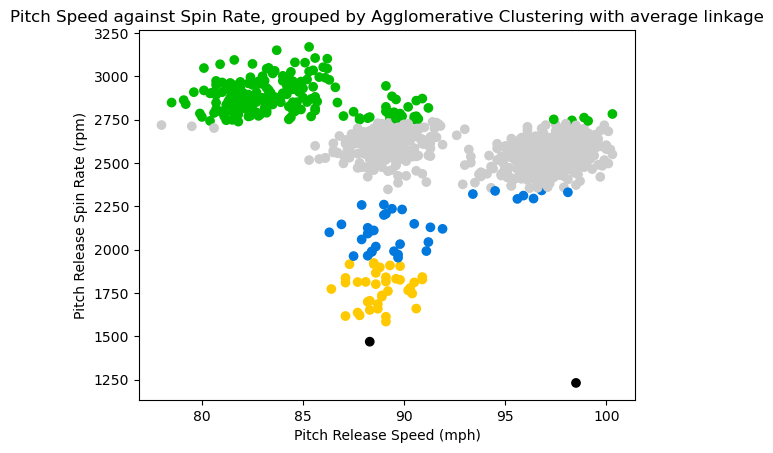

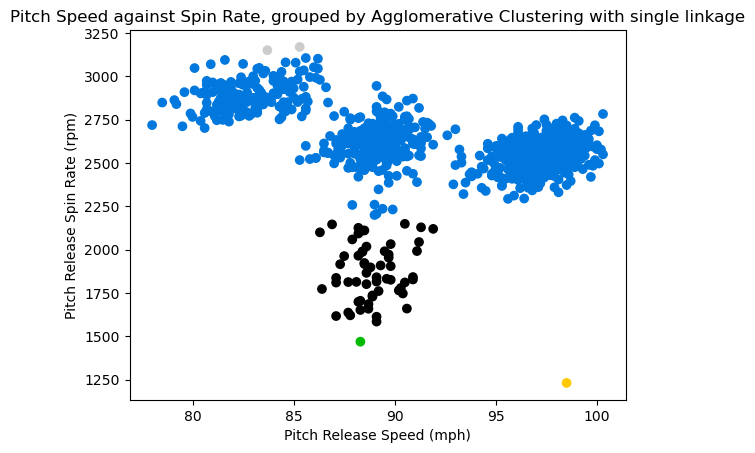

In [102]:
ACmodels = {}
AClabels = {}
for link in ['ward', 'complete', 'average', 'single']:
    model6 = cluster.AgglomerativeClustering(n_clusters=len(set(coleTrainY2.to_numpy())), linkage = link)
    model6.fit(coleTrainX2)

    model6ClusterLabels = model6.fit_predict(coleTestX2)

    ACmodels[link], AClabels[link] = model6, model6ClusterLabels

    plt.scatter(coleTestX2['release_speed'],coleTestX2['release_spin_rate'],c=model6ClusterLabels,cmap='nipy_spectral')
    plt.title(f'Pitch Speed against Spin Rate, grouped by Agglomerative Clustering with {link} linkage')
    plt.xlabel('Pitch Release Speed (mph)')
    plt.ylabel('Pitch Release Spin Rate (rpm)')
    plt.show()

Single linkage performed the best out of the linkage methods, since it didn't stripe across clusters, however it still merged clusters together.

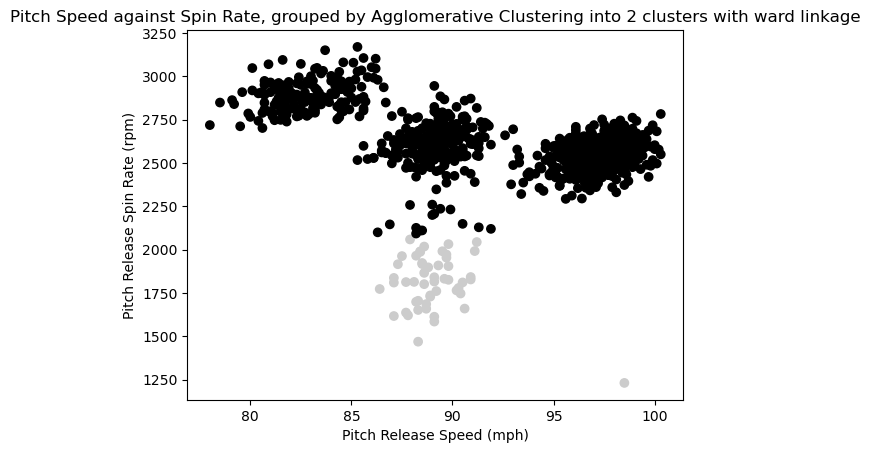

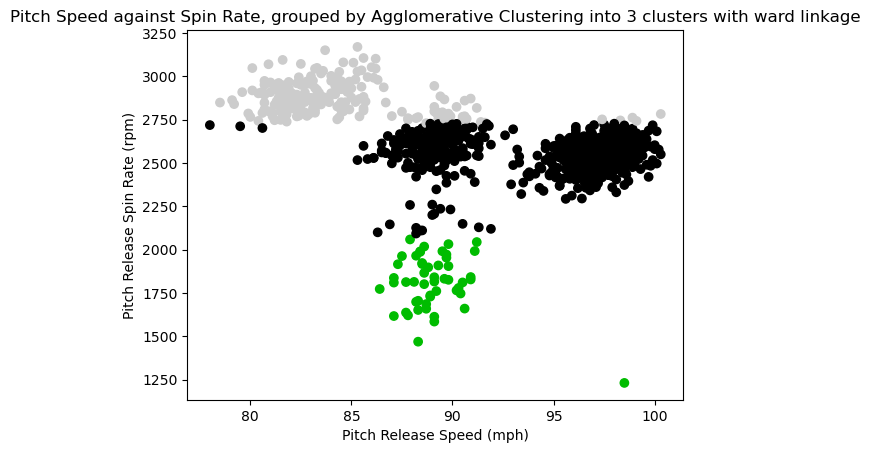

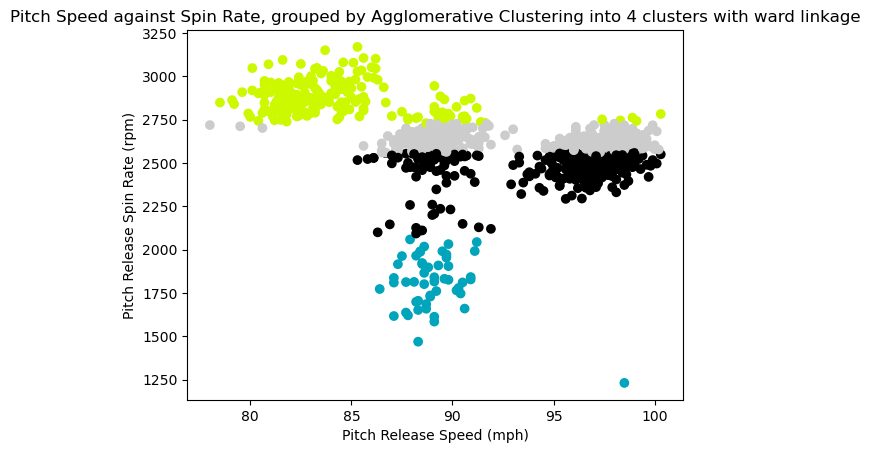

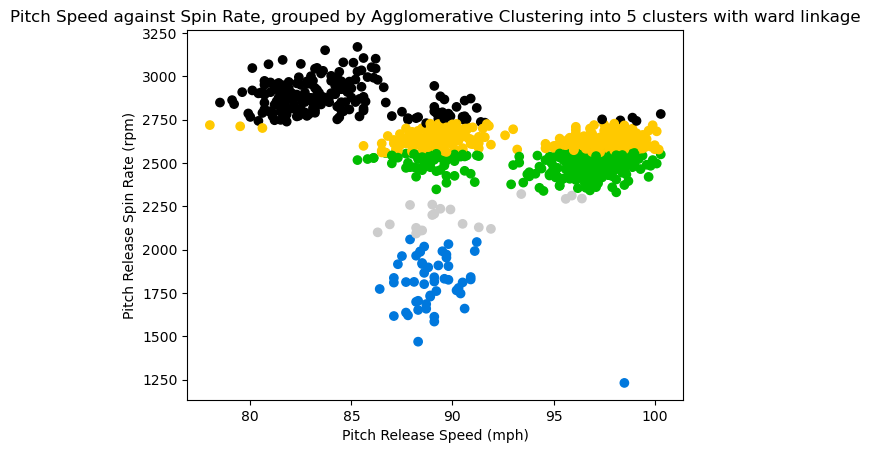

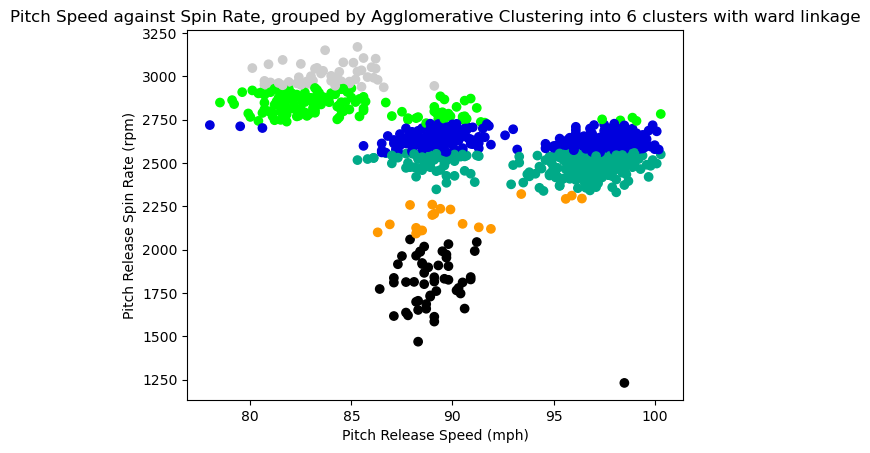

...

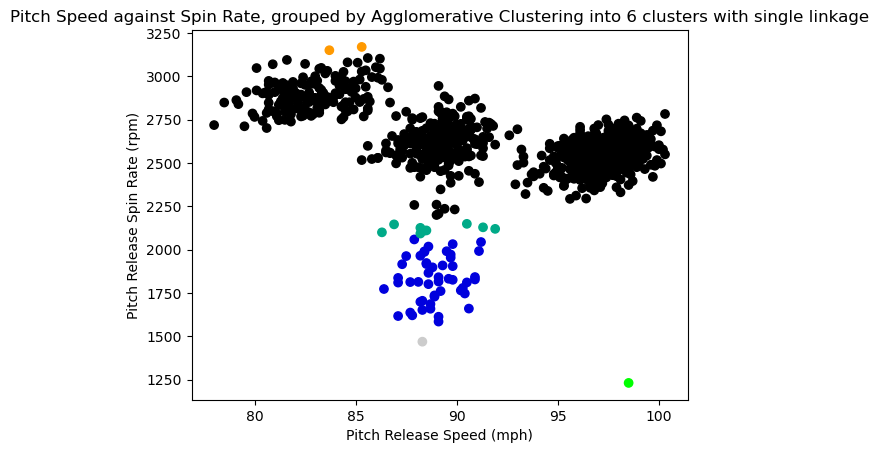

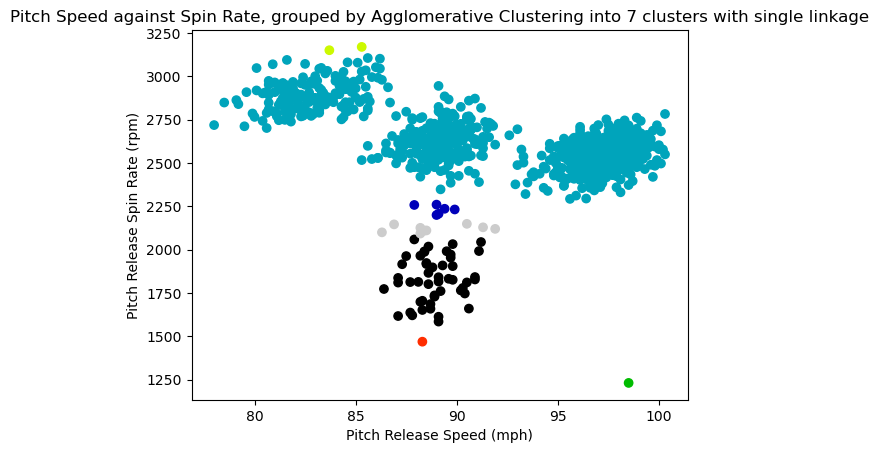

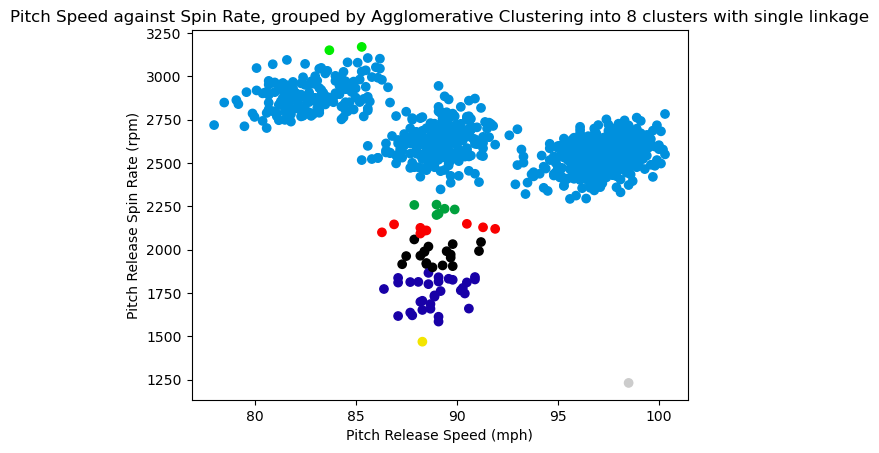

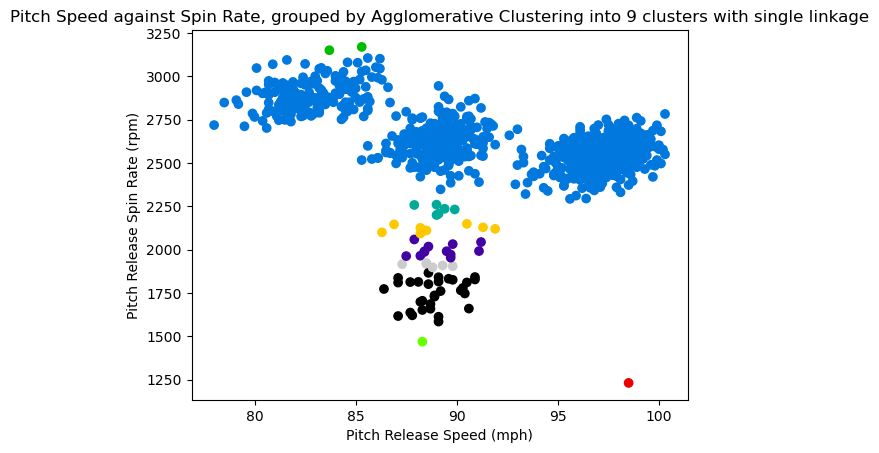

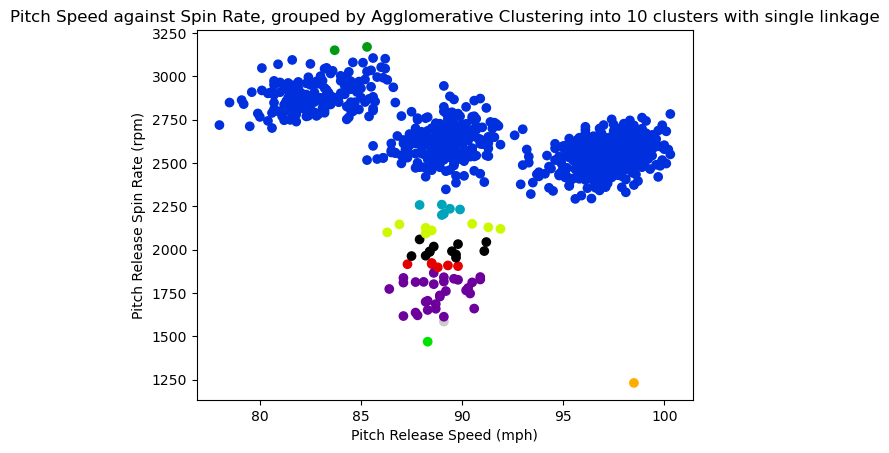

In [103]:
for link in ['ward', 'complete', 'average', 'single']:
    for i in range(2,11):
        model7 = cluster.AgglomerativeClustering(n_clusters=i, linkage = link)
        model7.fit(coleTrainX2)

        model7ClusterLabels = model7.fit_predict(coleTestX2)

        ACmodels[(i,link)], AClabels[(i,link)] = model7, model7ClusterLabels

        plt.scatter(coleTestX2['release_speed'],coleTestX2['release_spin_rate'],c=model7ClusterLabels,cmap='nipy_spectral')
        plt.title(f'Pitch Speed against Spin Rate, grouped by Agglomerative Clustering into {i} clusters with {link} linkage')
        plt.xlabel('Pitch Release Speed (mph)')
        plt.ylabel('Pitch Release Spin Rate (rpm)')
        plt.show()

In [180]:
coleTrainX3, coleTestX3, coleTrainY3, coleTestYAct3 = getData(cole,['spin_axis','release_spin_rate','release_speed'],'pitch_type',0.25)


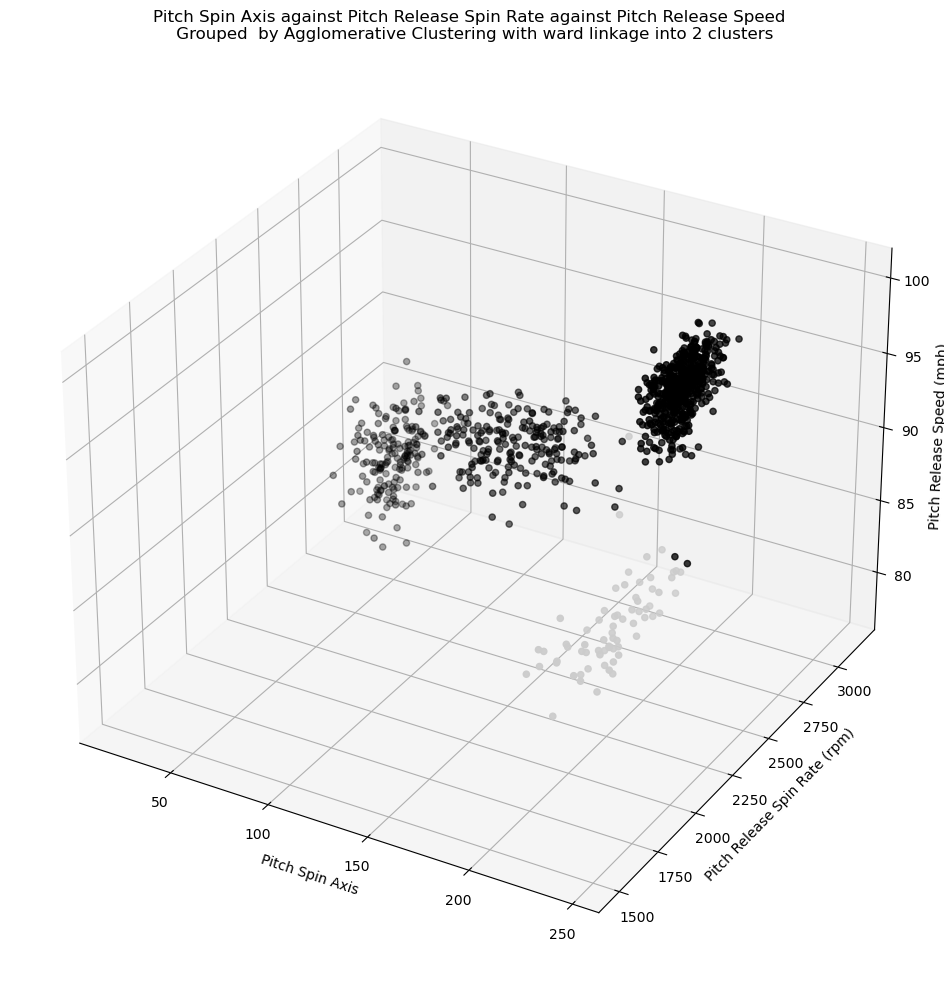

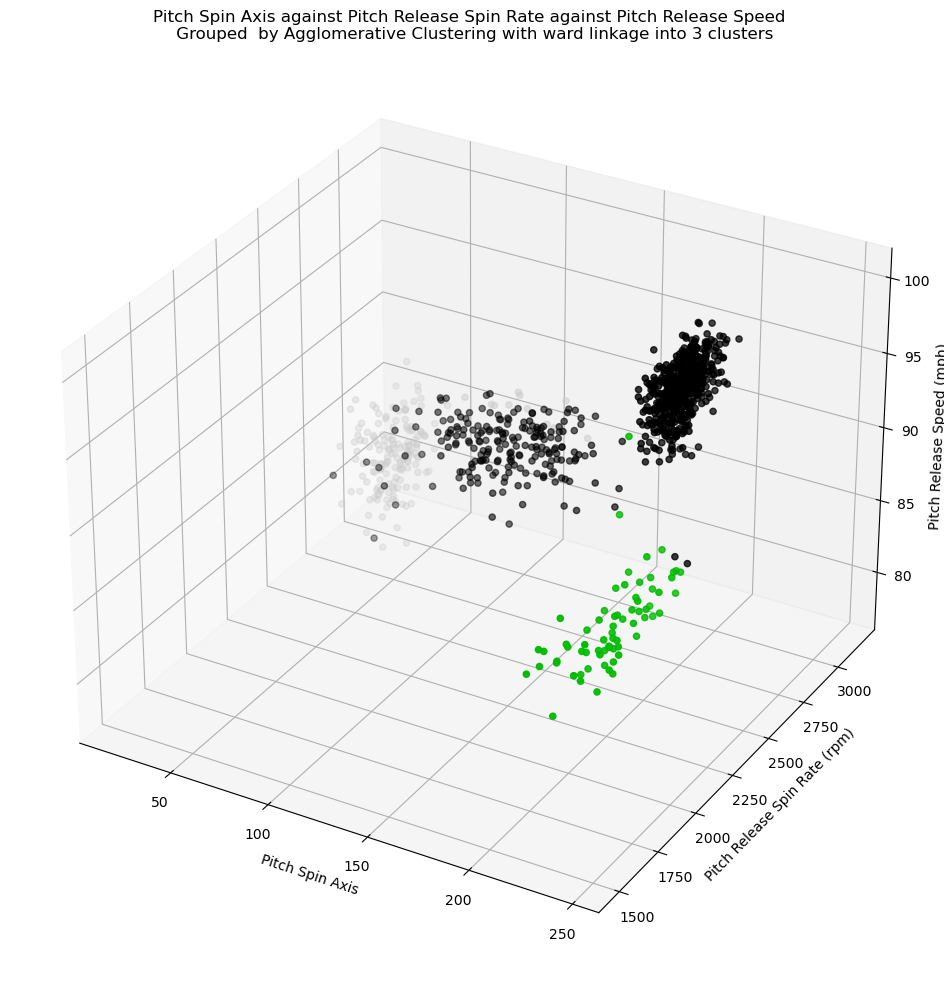

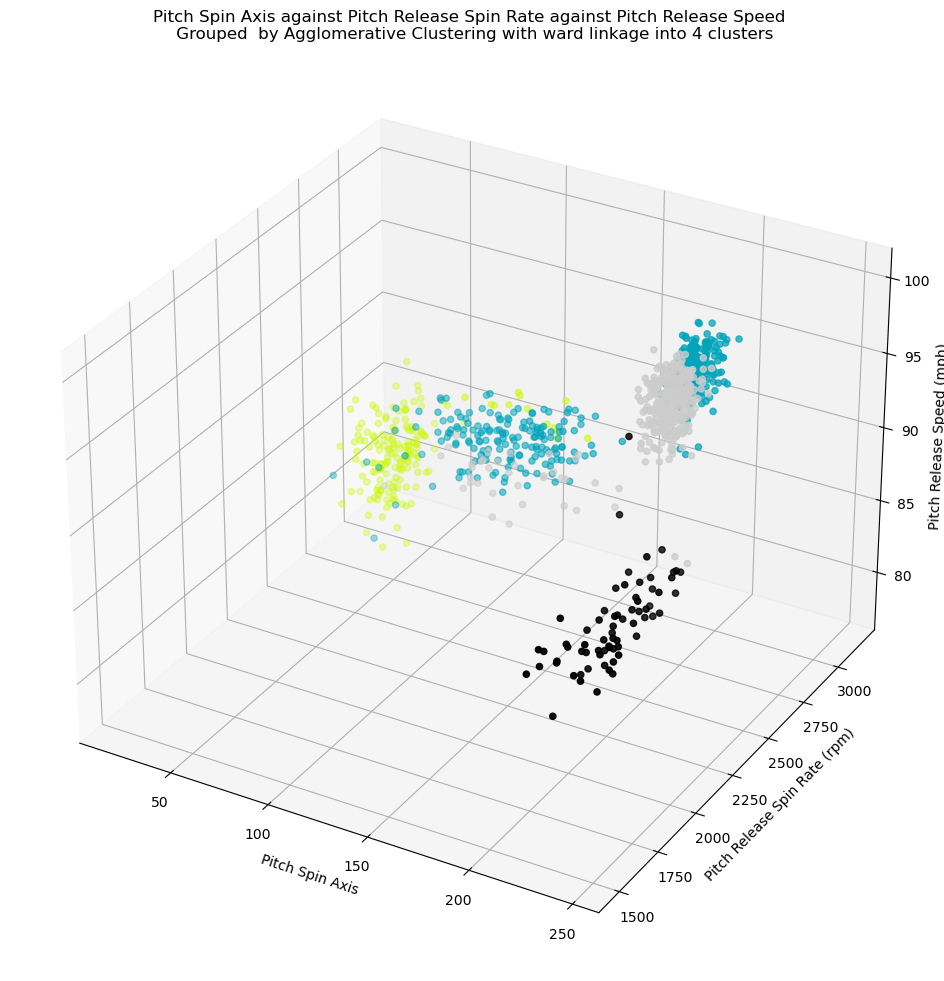

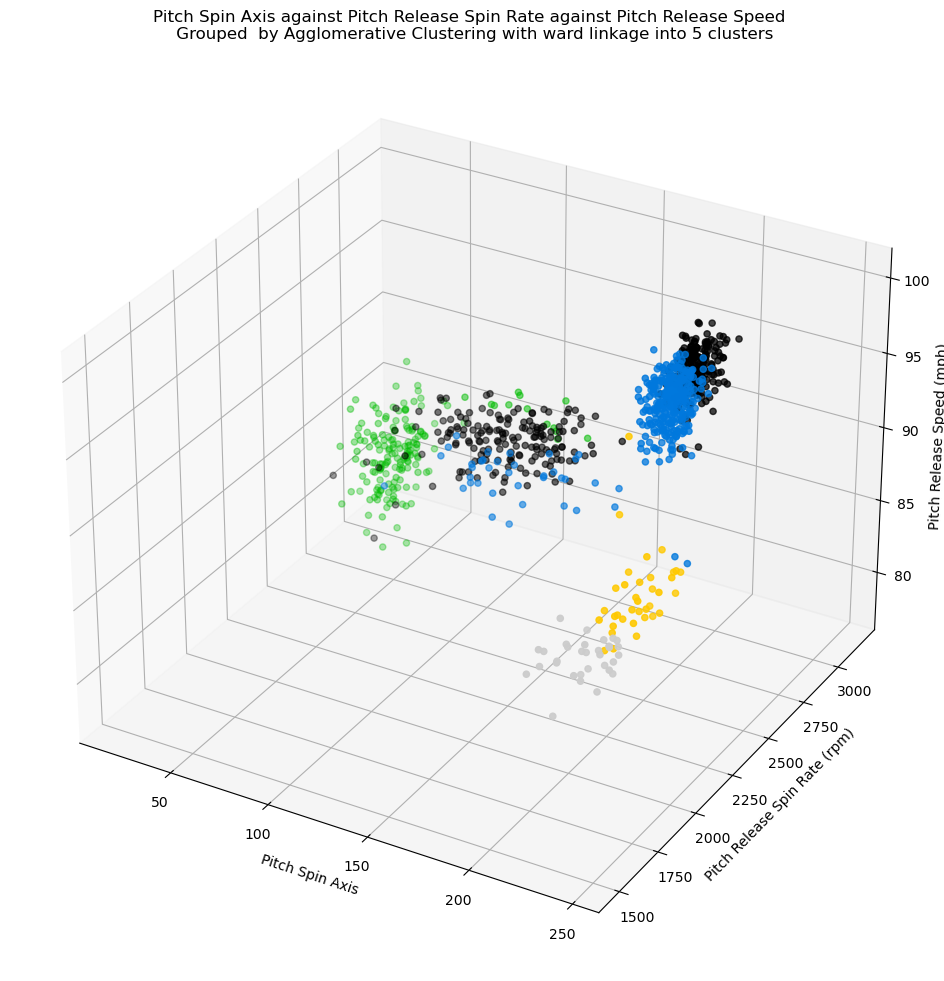

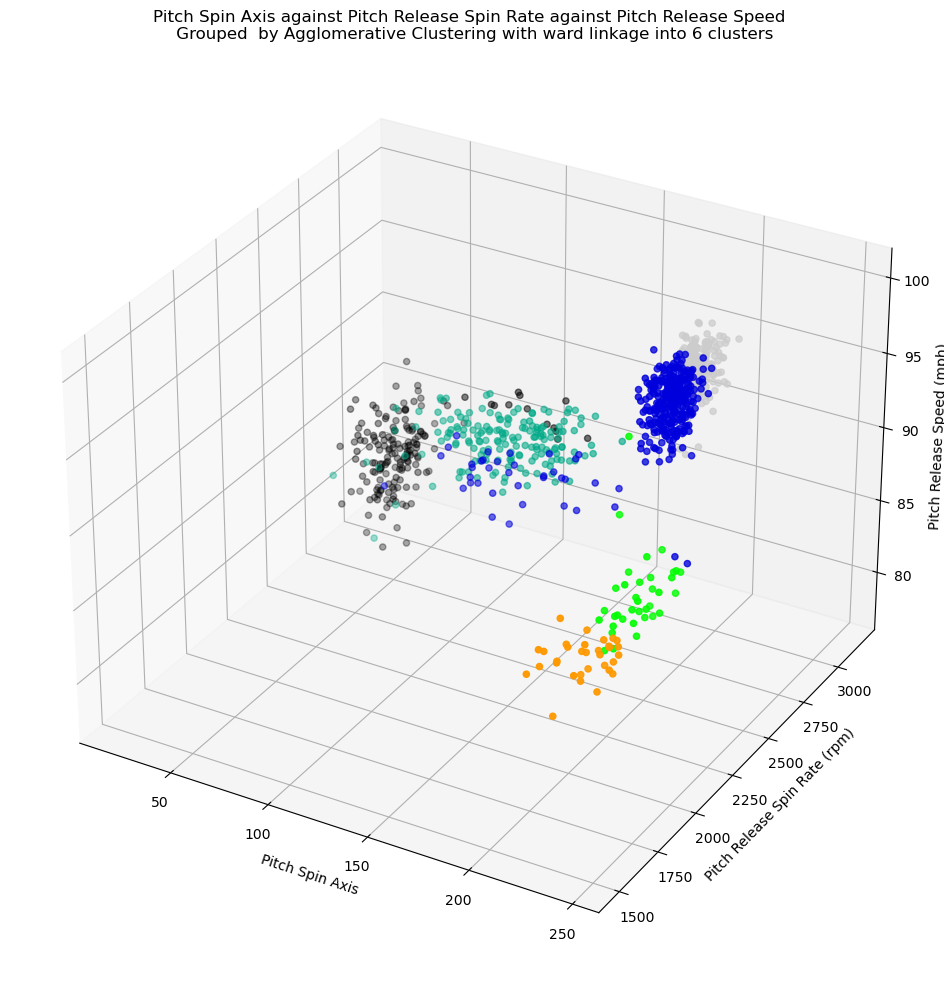

...

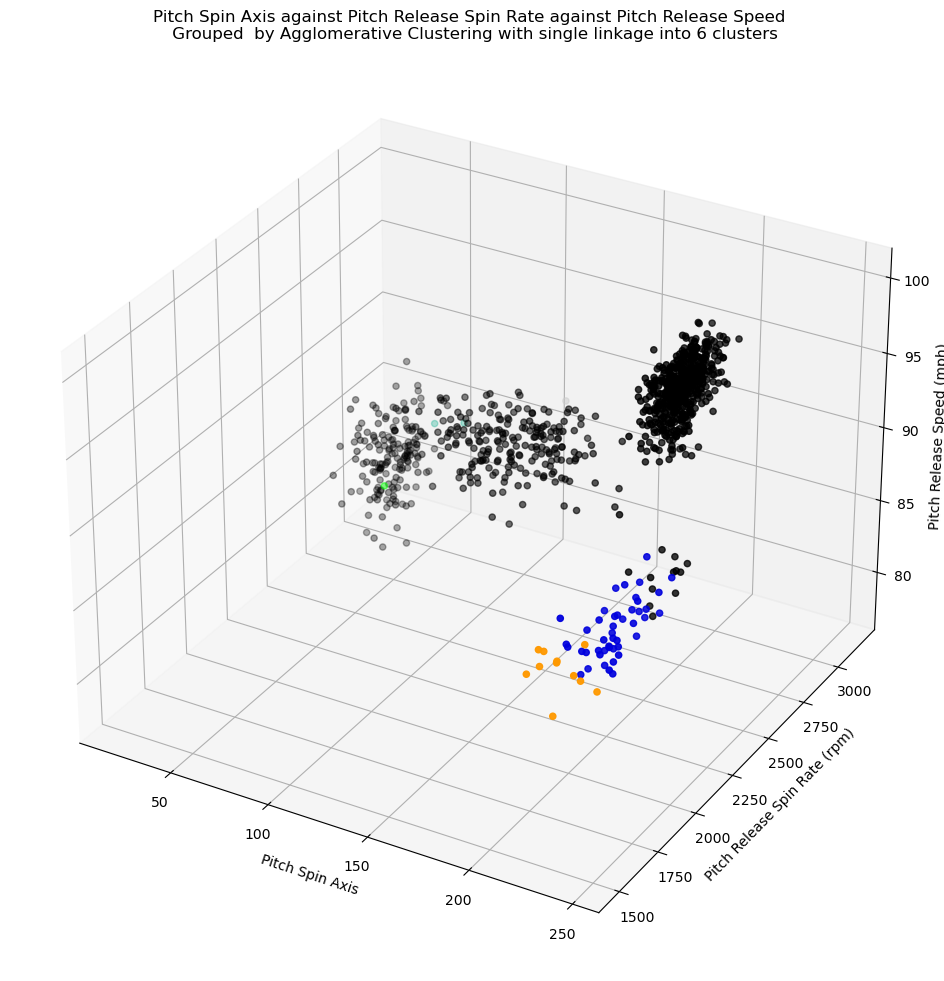

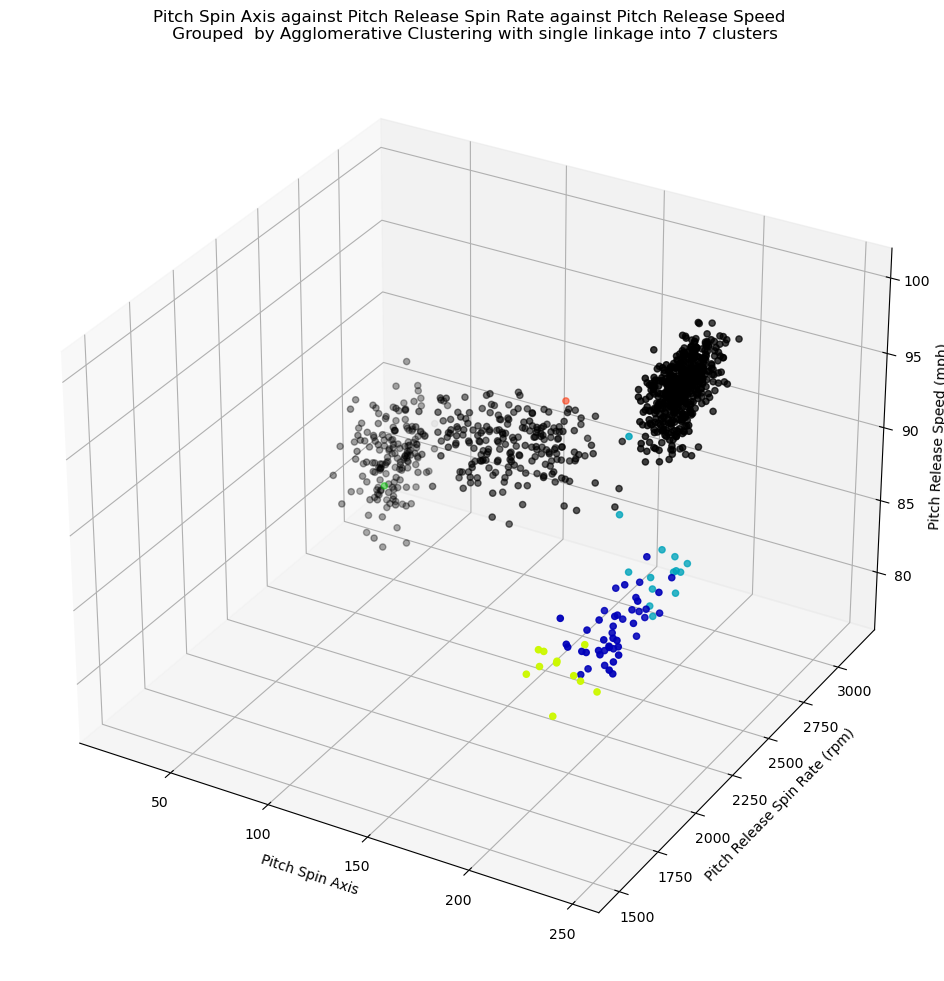

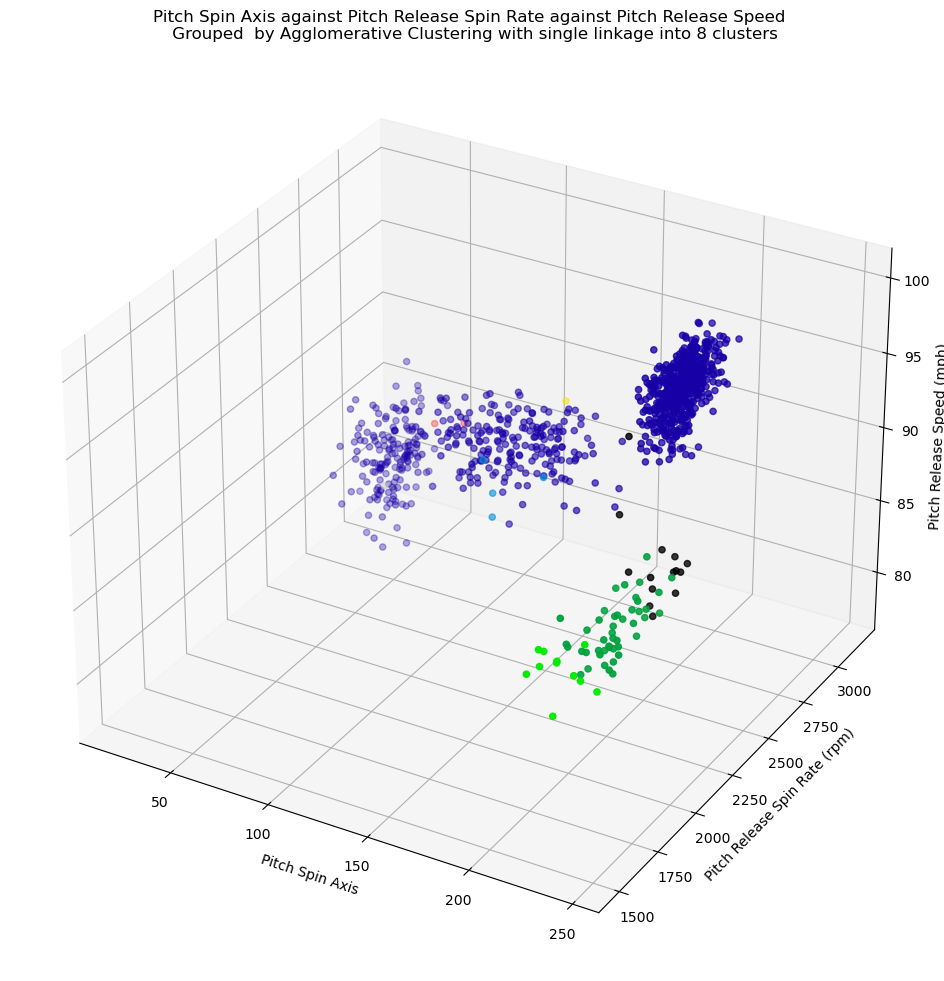

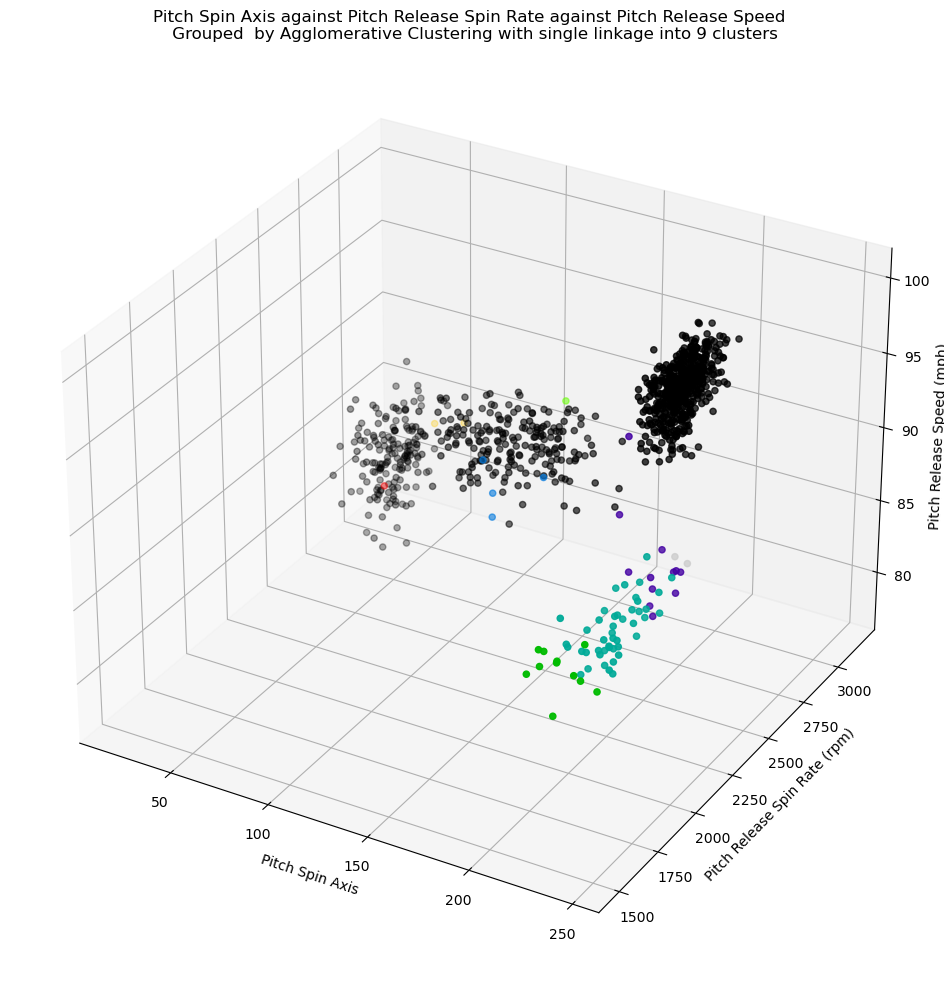

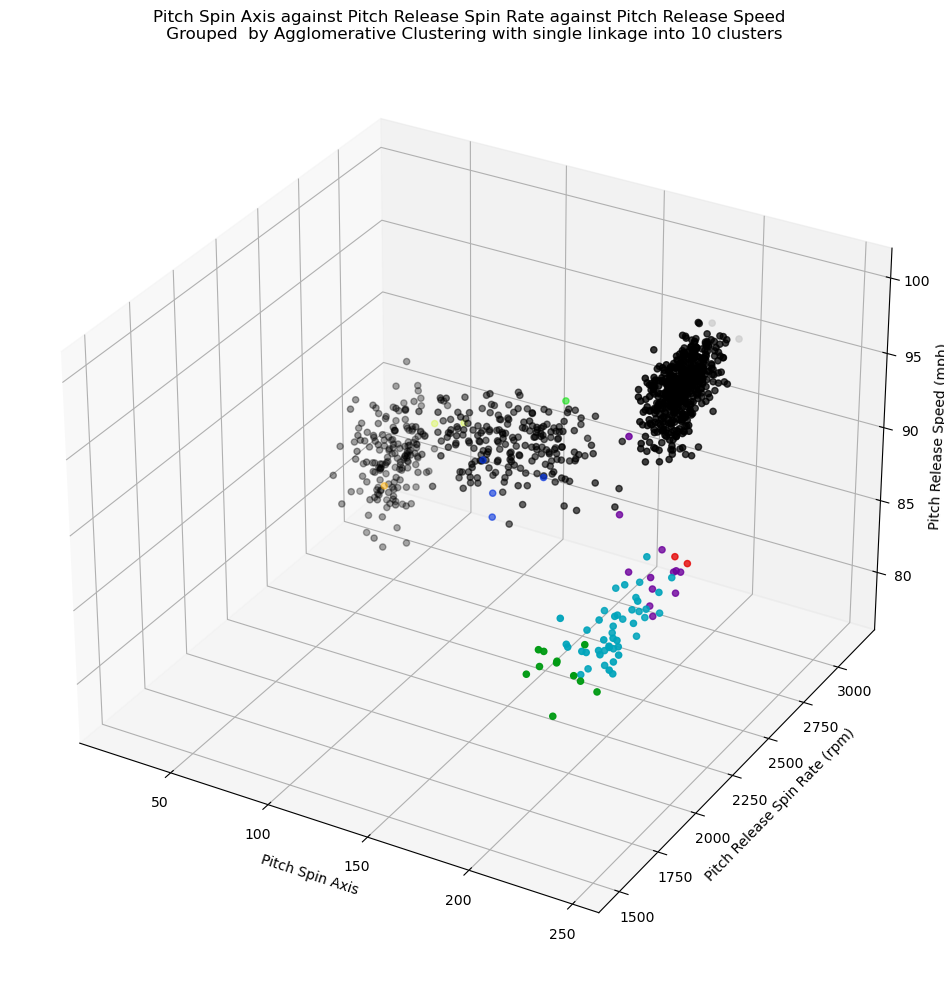

In [108]:
TdACmodels = {}
TdAClabels = {}
for link in ['ward', 'complete', 'average', 'single']:
    for i in range(2,11):
        model8 = cluster.AgglomerativeClustering(n_clusters=i, linkage = link)
        model8.fit(coleTrainX3)

        model8ClusterLabels = model8.fit_predict(coleTestX3)

        TdACmodels[(i,link)], TdAClabels[(i,link)] = model8, model8ClusterLabels

        fig = plt.figure()
        ax = fig.add_subplot(projection = '3d')
        ax.scatter(coleTestX3['spin_axis'], coleTestX3['release_spin_rate'], coleTestX3['release_speed'], c = model8ClusterLabels, cmap = 'nipy_spectral')
        ax.set_title(f'Pitch Spin Axis against Pitch Release Spin Rate against Pitch Release Speed \n Grouped  by Agglomerative Clustering with {link} linkage into {i} clusters')
        ax.set_zlabel('Pitch Release Speed (mph)')
        ax.set_ylabel('Pitch Release Spin Rate (rpm)')
        ax.set_xlabel('Pitch Spin Axis')
        fig.set_size_inches(12, 12)
        plt.show()

I decided to iterate every linkage method from 2 to 11 clusters to see how the clusters form. Apart from single linkage, every other linkage type started splitting clusters after n_clusters was greater than 3.

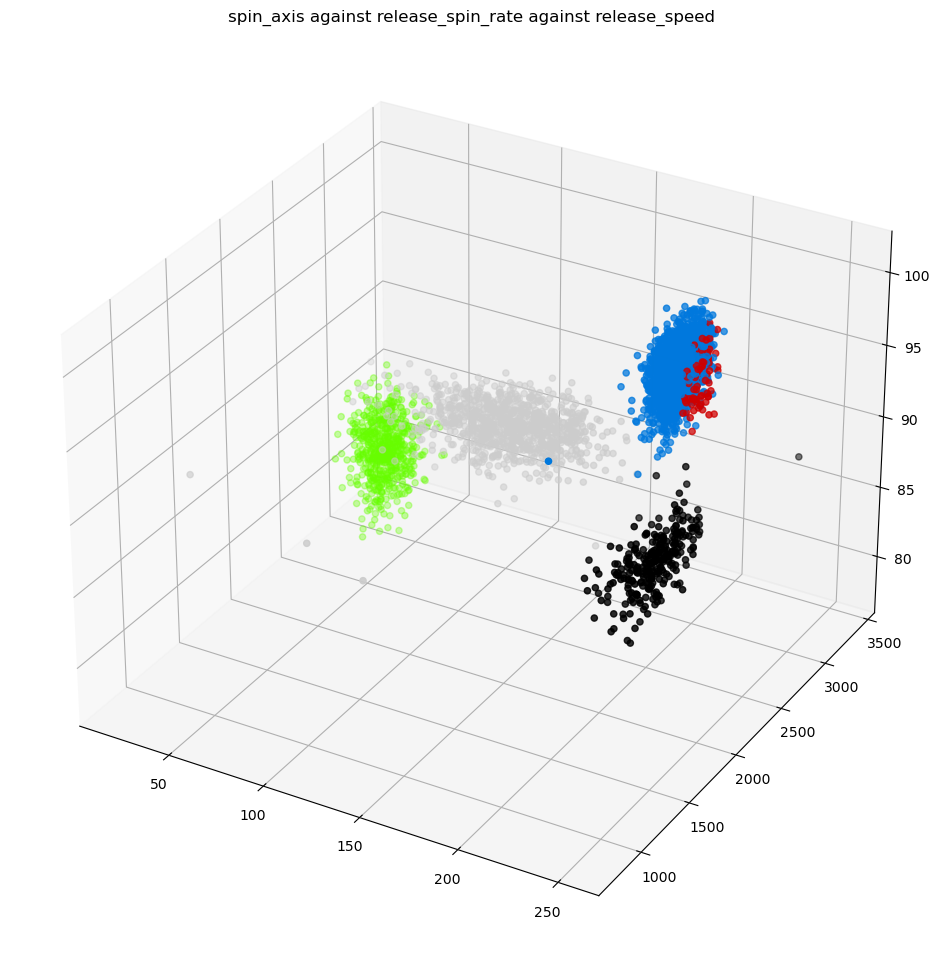

In [35]:
createPlot3d(cole,'spin_axis','release_spin_rate','release_speed')

## K-Means Clustering

K-Means tries to create clusters by minimising inertia (the distance between samples in each cluster). The number of clusters needs to specified, to we will set n_clusters to 5 and test the cole dataset.

/opt/anaconda3/envs/spyd/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


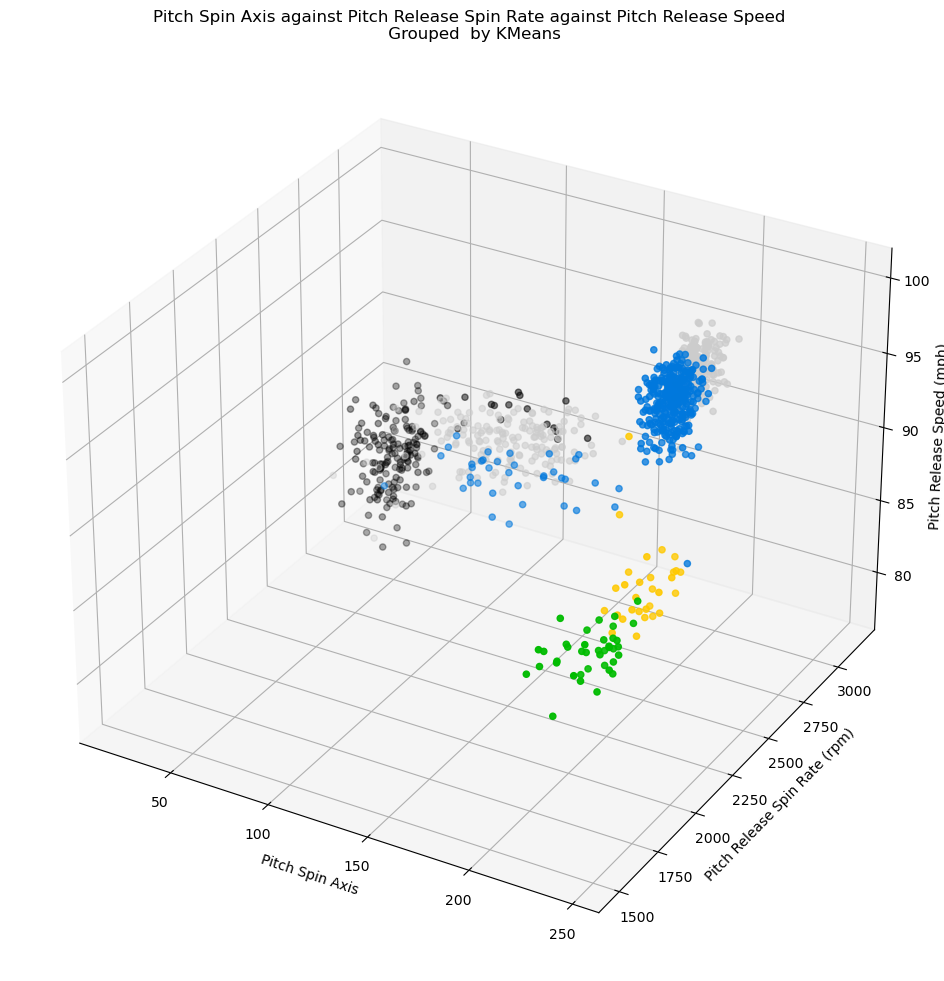

In [143]:
model9 = cluster.KMeans(n_clusters=5)
model9.fit(coleTrainX3)

model9ClusterLabels = model9.predict(coleTestX3)

fig = plt.figure()
ax = fig.add_subplot(projection = '3d')
ax.scatter(coleTestX3['spin_axis'], coleTestX3['release_spin_rate'], coleTestX3['release_speed'], c = model9ClusterLabels, cmap = 'nipy_spectral')
ax.set_title(f'Pitch Spin Axis against Pitch Release Spin Rate against Pitch Release Speed \n Grouped  by KMeans')
ax.set_zlabel('Pitch Release Speed (mph)')
ax.set_ylabel('Pitch Release Spin Rate (rpm)')
ax.set_xlabel('Pitch Spin Axis')
fig.set_size_inches(12, 12)
plt.show()

K-Means did not work very well on the dataset, as the labelling was mismatched.

/opt/anaconda3/envs/spyd/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


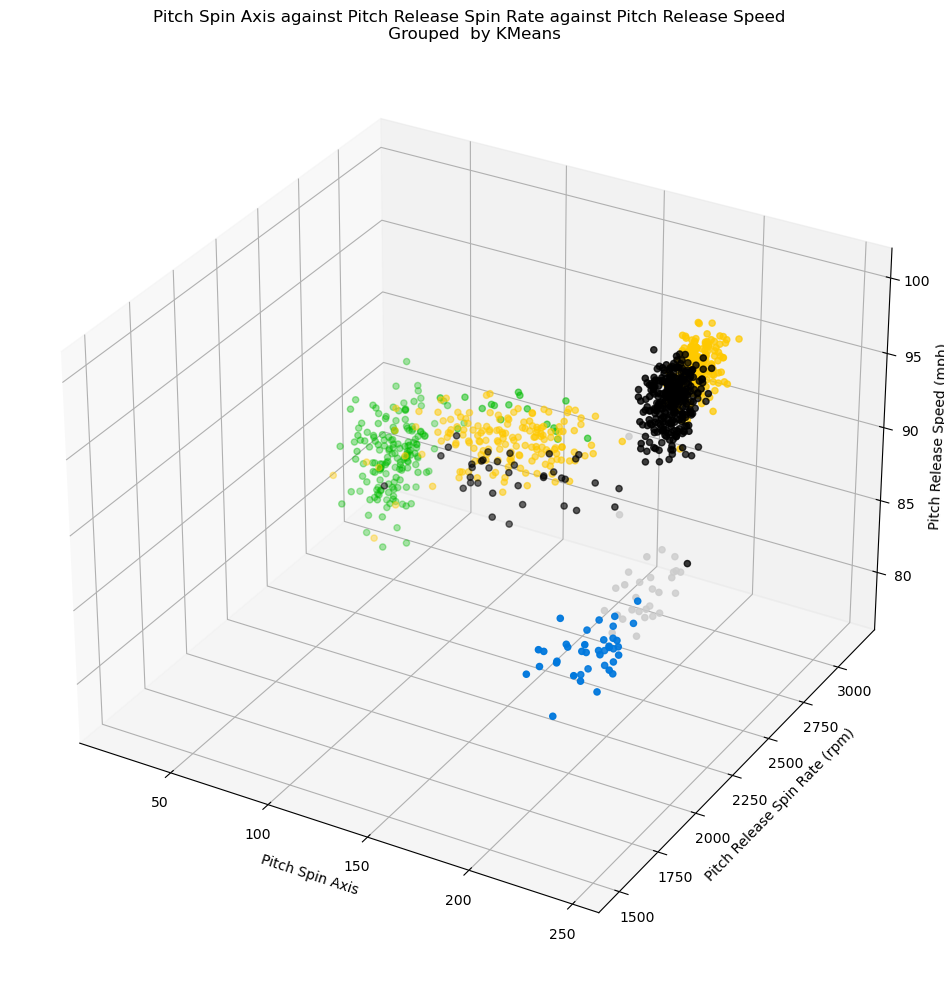

In [114]:
model9 = cluster.KMeans(n_clusters = 5, algorithm = 'elkan')
model9.fit(coleTrainX3)

model9ClusterLabels = model9.predict(coleTestX3)

fig = plt.figure()
ax = fig.add_subplot(projection = '3d')
ax.scatter(coleTestX3['spin_axis'], coleTestX3['release_spin_rate'], coleTestX3['release_speed'], c = model9ClusterLabels, cmap = 'nipy_spectral')
ax.set_title(f'Pitch Spin Axis against Pitch Release Spin Rate against Pitch Release Speed \n Grouped  by KMeans')
ax.set_zlabel('Pitch Release Speed (mph)')
ax.set_ylabel('Pitch Release Spin Rate (rpm)')
ax.set_xlabel('Pitch Spin Axis')
fig.set_size_inches(12, 12)
plt.show()

Using the elkan algorithm, which is supposed to work better on clearly defined clusters, made no difference as the labels appear the same.

## Affinity Propagation

In Affinity Propagation, each sample sends a message to other points informing them of their relative attractiveness, which can be dampened by a parameter. To test this, we will use the cole dataset and iterate through damping values between 0.5 and 1.0.

/opt/anaconda3/envs/spyd/lib/python3.8/site-packages/sklearn/cluster/_affinity_propagation.py:143: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(


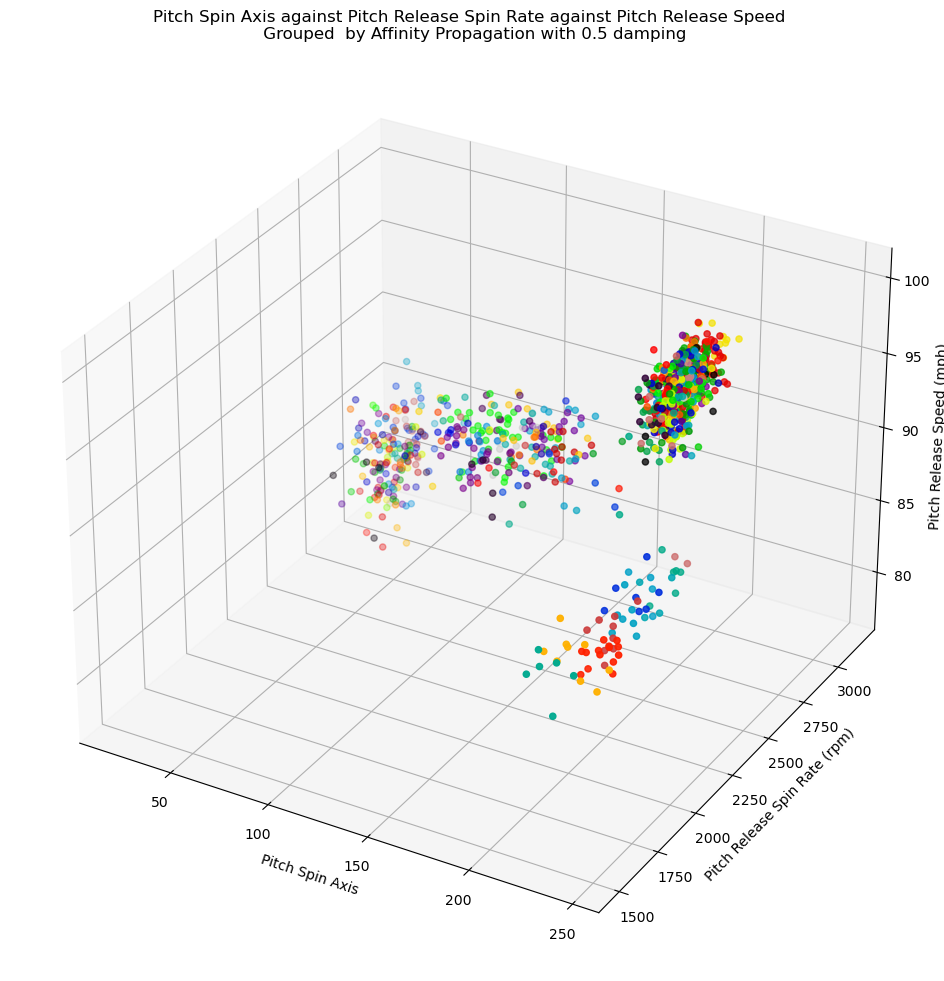

/opt/anaconda3/envs/spyd/lib/python3.8/site-packages/sklearn/cluster/_affinity_propagation.py:143: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(


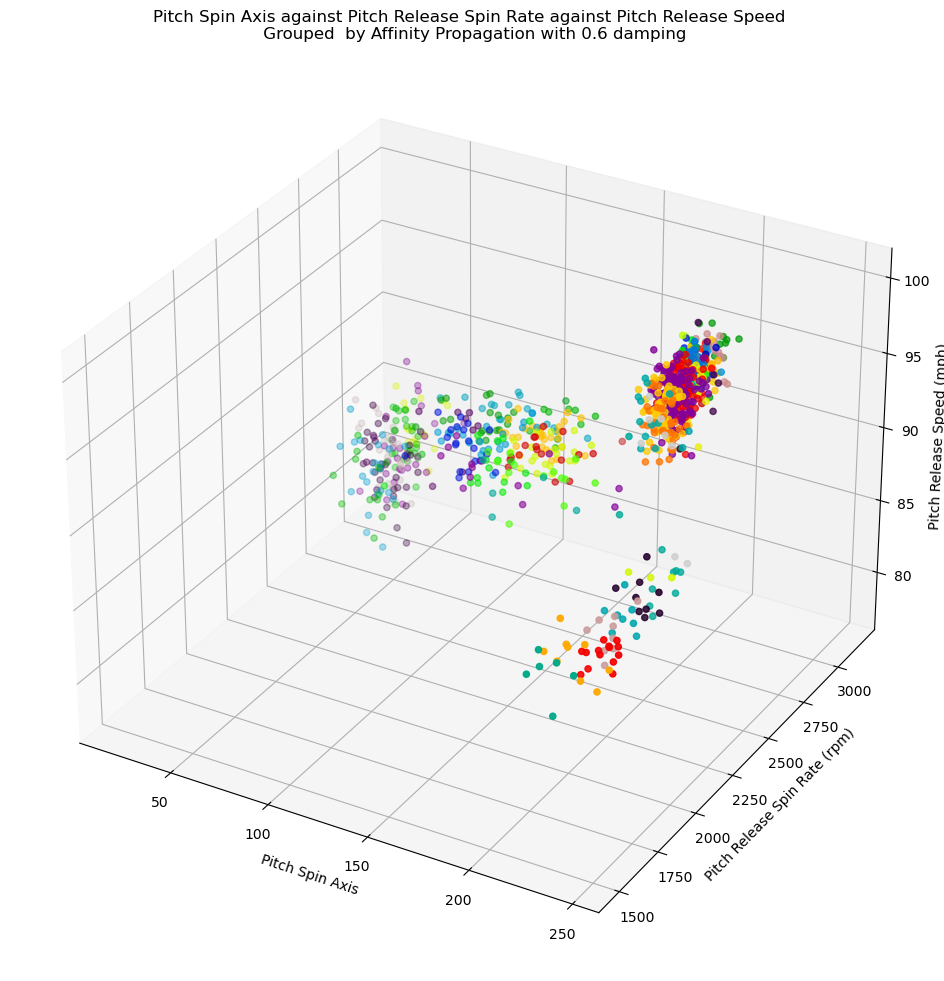

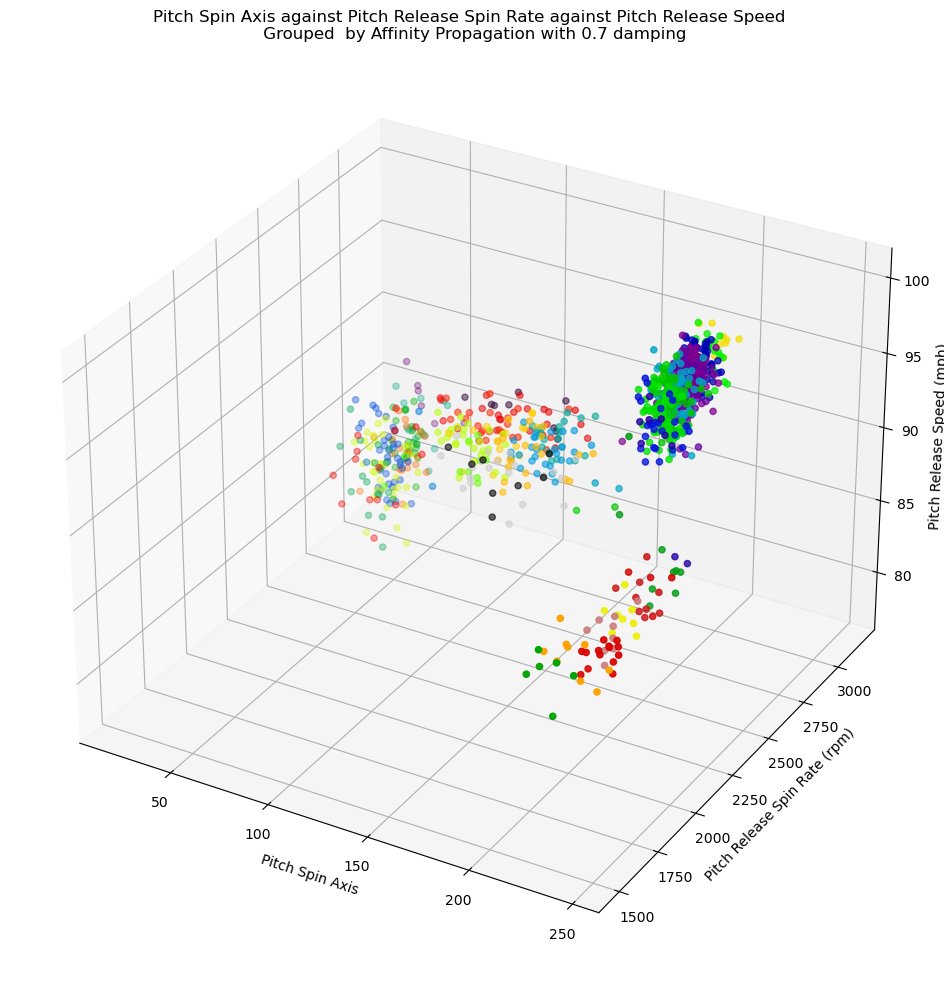

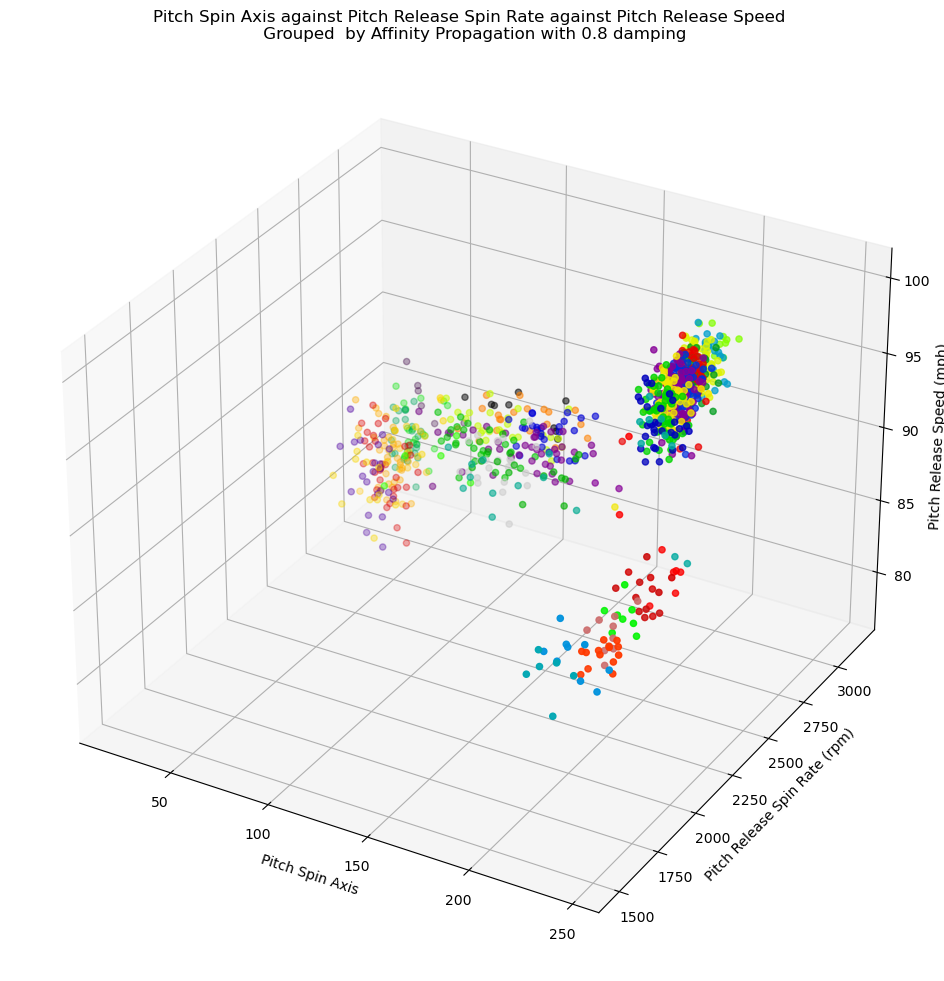

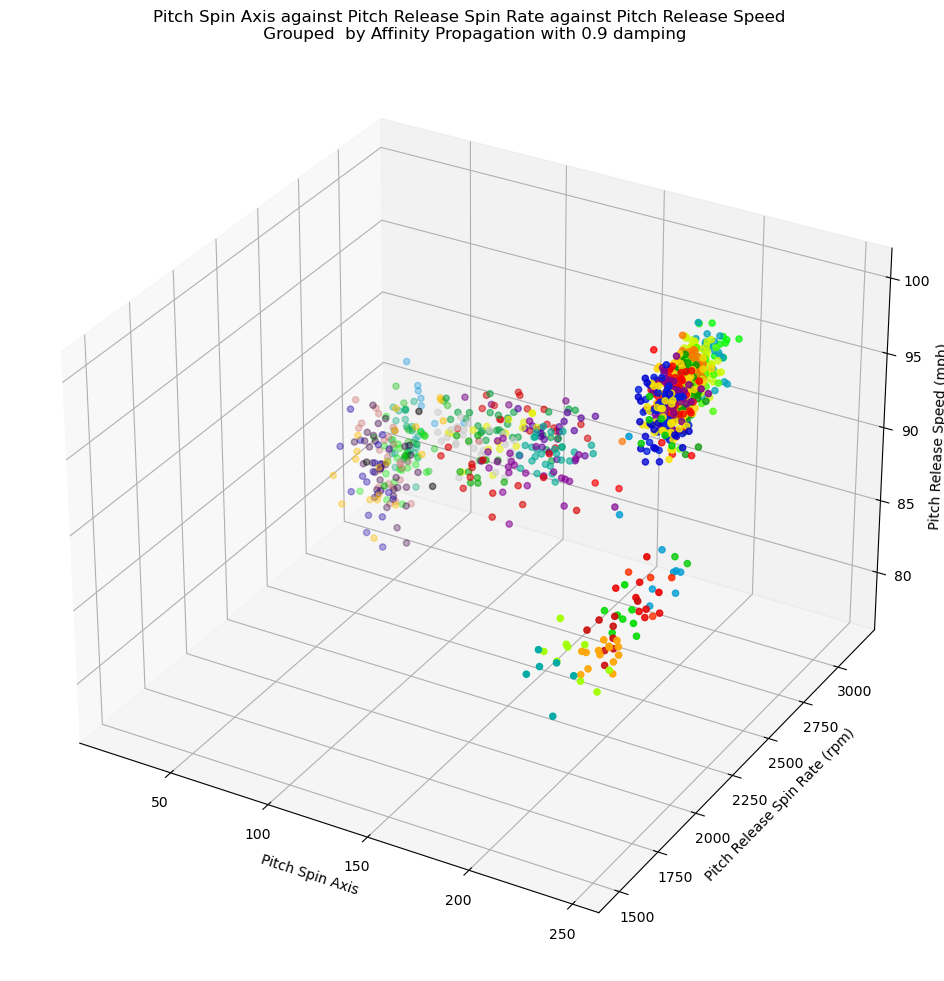

InvalidParameterError: The 'damping' parameter of AffinityPropagation must be a float in the range [0.5, 1.0). Got 1.0 instead.

In [116]:
TdAPmodels = {}
TdAPlabels = {}

for d in range(5,11):
    damp = d/10
    model10 = cluster.AffinityPropagation(damping = damp)
    model10.fit(coleTrainX3)

    model10ClusterLabels = model10.predict(coleTestX3)

    TdAPmodels[damp], TdAPlabels[damp] = model10, model10ClusterLabels

    fig = plt.figure()
    ax = fig.add_subplot(projection = '3d')
    ax.scatter(coleTestX3['spin_axis'], coleTestX3['release_spin_rate'], coleTestX3['release_speed'], c = model10ClusterLabels, cmap = 'nipy_spectral')
    ax.set_title(f'Pitch Spin Axis against Pitch Release Spin Rate against Pitch Release Speed \n Grouped  by Affinity Propagation with {damp} damping')
    ax.set_zlabel('Pitch Release Speed (mph)')
    ax.set_ylabel('Pitch Release Spin Rate (rpm)')
    ax.set_xlabel('Pitch Spin Axis')
    fig.set_size_inches(12, 12)
    plt.show()

It seems that we cannot use 1 as a value for damping, so we should try using a damping value of 0.95.

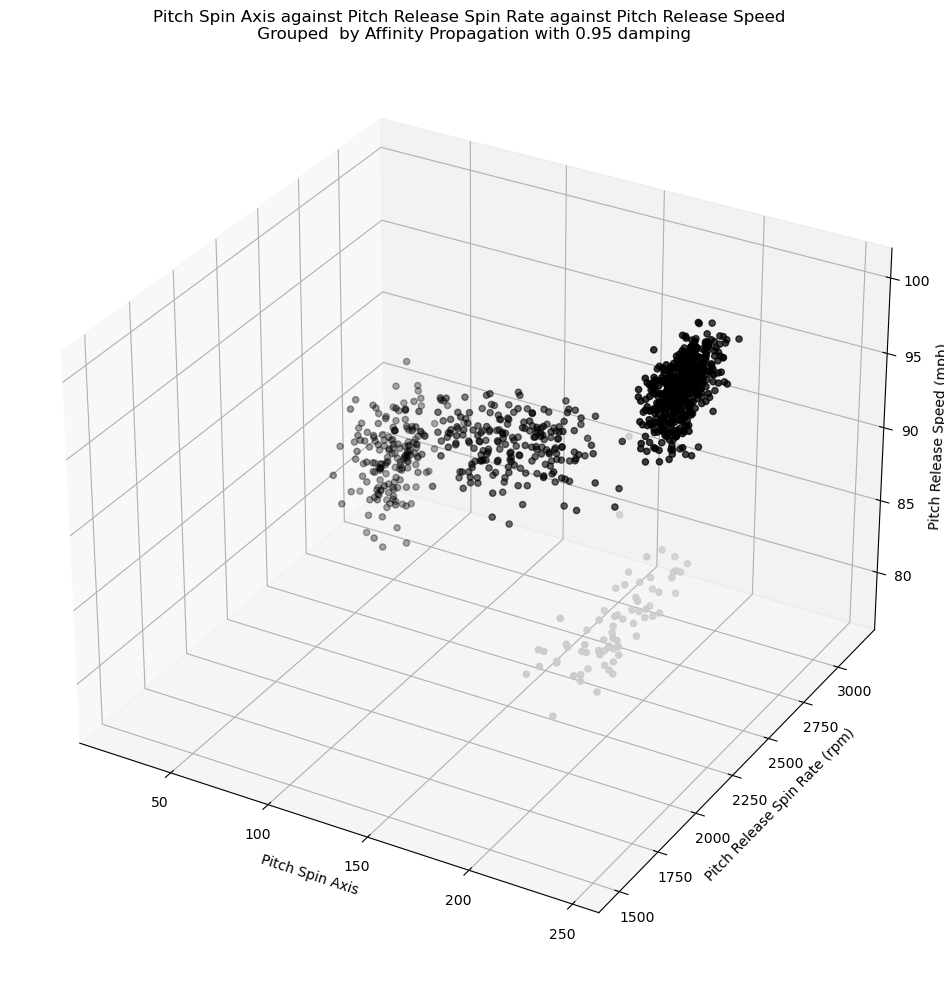

In [117]:
model11 = cluster.AffinityPropagation(damping = 0.95, max_iter = 1000, convergence_iter = 10)
model11.fit(coleTrainX3)

model11ClusterLabels = model11.predict(coleTestX3)

TdAPmodels[0.95], TdAPlabels[0.95] = model11, model11ClusterLabels

fig = plt.figure()
ax = fig.add_subplot(projection = '3d')
ax.scatter(coleTestX3['spin_axis'], coleTestX3['release_spin_rate'], coleTestX3['release_speed'], c = model11ClusterLabels, cmap = 'nipy_spectral')
ax.set_title(f'Pitch Spin Axis against Pitch Release Spin Rate against Pitch Release Speed \n Grouped  by Affinity Propagation with {0.95} damping')
ax.set_zlabel('Pitch Release Speed (mph)')
ax.set_ylabel('Pitch Release Spin Rate (rpm)')
ax.set_xlabel('Pitch Spin Axis')
fig.set_size_inches(12, 12)
plt.show()

A damping value of 0.95 creates two clear clusters, which is better than most of the other clustering methods used to this point other than DB Scan.

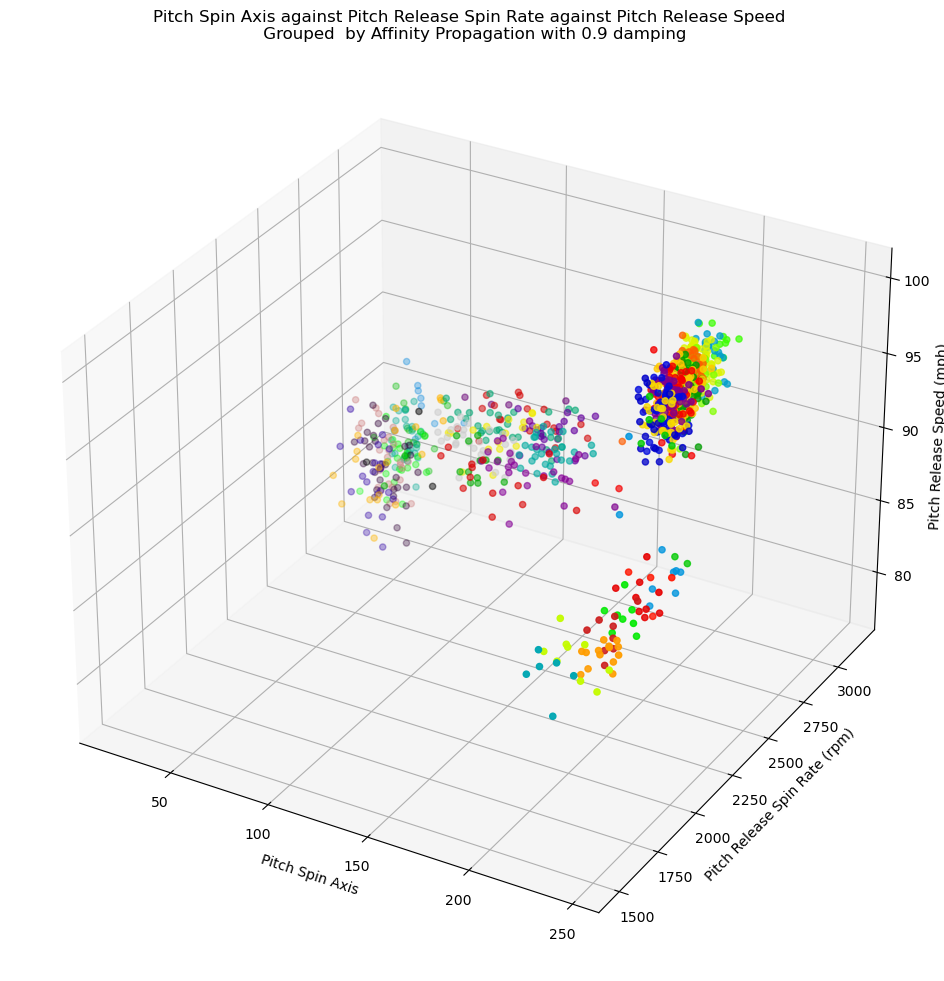

In [119]:
model11 = cluster.AffinityPropagation(damping = 0.9, max_iter = 1000, convergence_iter = 10)
model11.fit(coleTrainX3)

model11ClusterLabels = model11.predict(coleTestX3)

fig = plt.figure()
ax = fig.add_subplot(projection = '3d')
ax.scatter(coleTestX3['spin_axis'], coleTestX3['release_spin_rate'], coleTestX3['release_speed'], c = model11ClusterLabels, cmap = 'nipy_spectral')
ax.set_title(f'Pitch Spin Axis against Pitch Release Spin Rate against Pitch Release Speed \n Grouped  by Affinity Propagation with {0.9} damping')
ax.set_zlabel('Pitch Release Speed (mph)')
ax.set_ylabel('Pitch Release Spin Rate (rpm)')
ax.set_xlabel('Pitch Spin Axis')
fig.set_size_inches(12, 12)
plt.show()

Decreasing the damping value to 0.9 and increasing the maximum iterations does not improve the result from earlier.

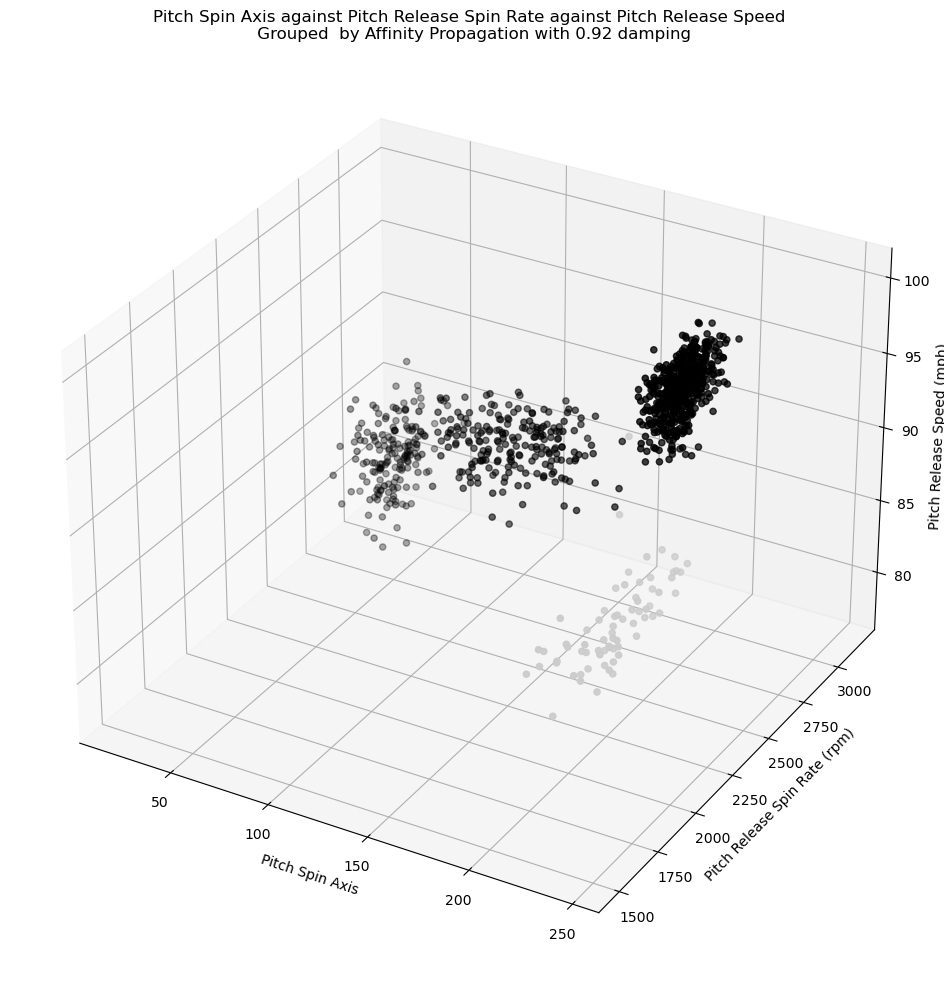

In [126]:
model11 = cluster.AffinityPropagation(damping = 0.92, max_iter = 1000, convergence_iter = 10)
model11.fit(coleTrainX3)

model11ClusterLabels = model11.predict(coleTestX3)

fig = plt.figure()
ax = fig.add_subplot(projection = '3d')
ax.scatter(coleTestX3['spin_axis'], coleTestX3['release_spin_rate'], coleTestX3['release_speed'], c = model11ClusterLabels, cmap = 'nipy_spectral')
ax.set_title(f'Pitch Spin Axis against Pitch Release Spin Rate against Pitch Release Speed \n Grouped  by Affinity Propagation with {0.92} damping')
ax.set_zlabel('Pitch Release Speed (mph)')
ax.set_ylabel('Pitch Release Spin Rate (rpm)')
ax.set_xlabel('Pitch Spin Axis')
fig.set_size_inches(12, 12)
plt.show()

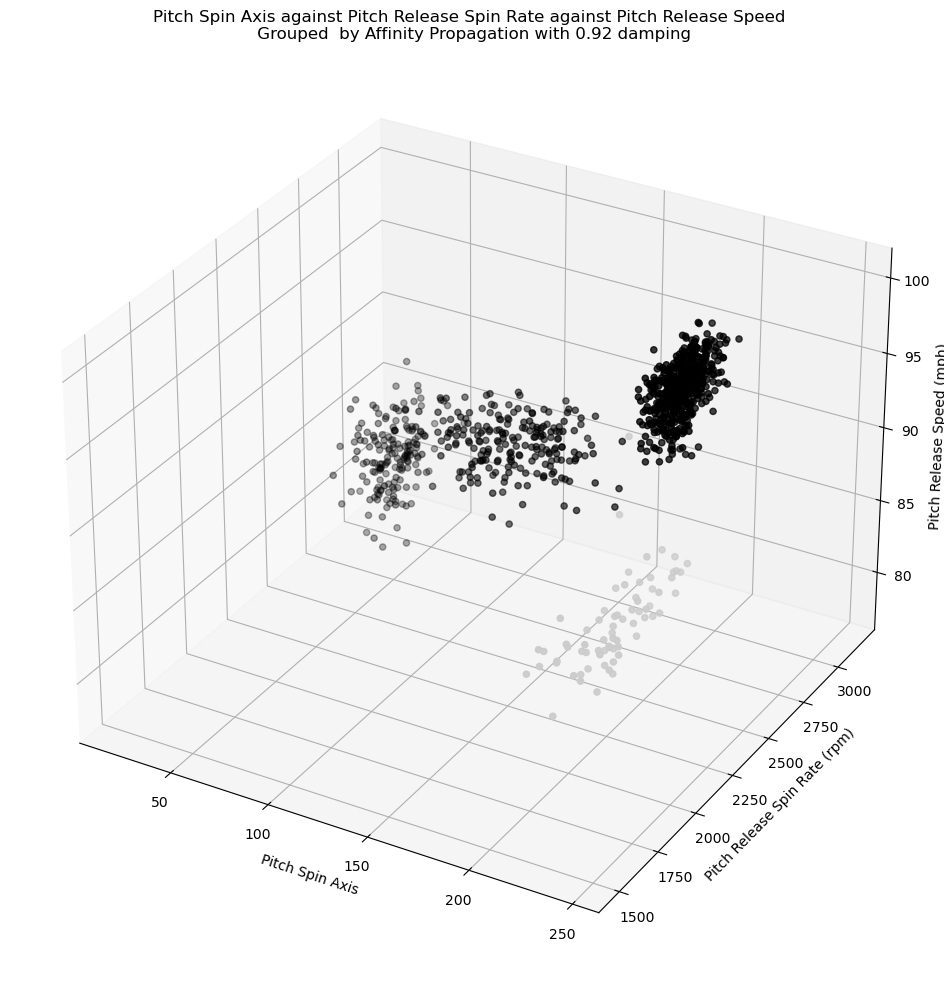

In [129]:
model12 = cluster.AffinityPropagation(damping = 0.92, max_iter = 100, convergence_iter = 10)
model12.fit(coleTrainX3)

model12ClusterLabels = model12.predict(coleTestX3)

fig = plt.figure()
ax = fig.add_subplot(projection = '3d')
ax.scatter(coleTestX3['spin_axis'], coleTestX3['release_spin_rate'], coleTestX3['release_speed'], c = model12ClusterLabels, cmap = 'nipy_spectral')
ax.set_title(f'Pitch Spin Axis against Pitch Release Spin Rate against Pitch Release Speed \n Grouped  by Affinity Propagation with {0.92} damping')
ax.set_zlabel('Pitch Release Speed (mph)')
ax.set_ylabel('Pitch Release Spin Rate (rpm)')
ax.set_xlabel('Pitch Spin Axis')
fig.set_size_inches(12, 12)
plt.show()

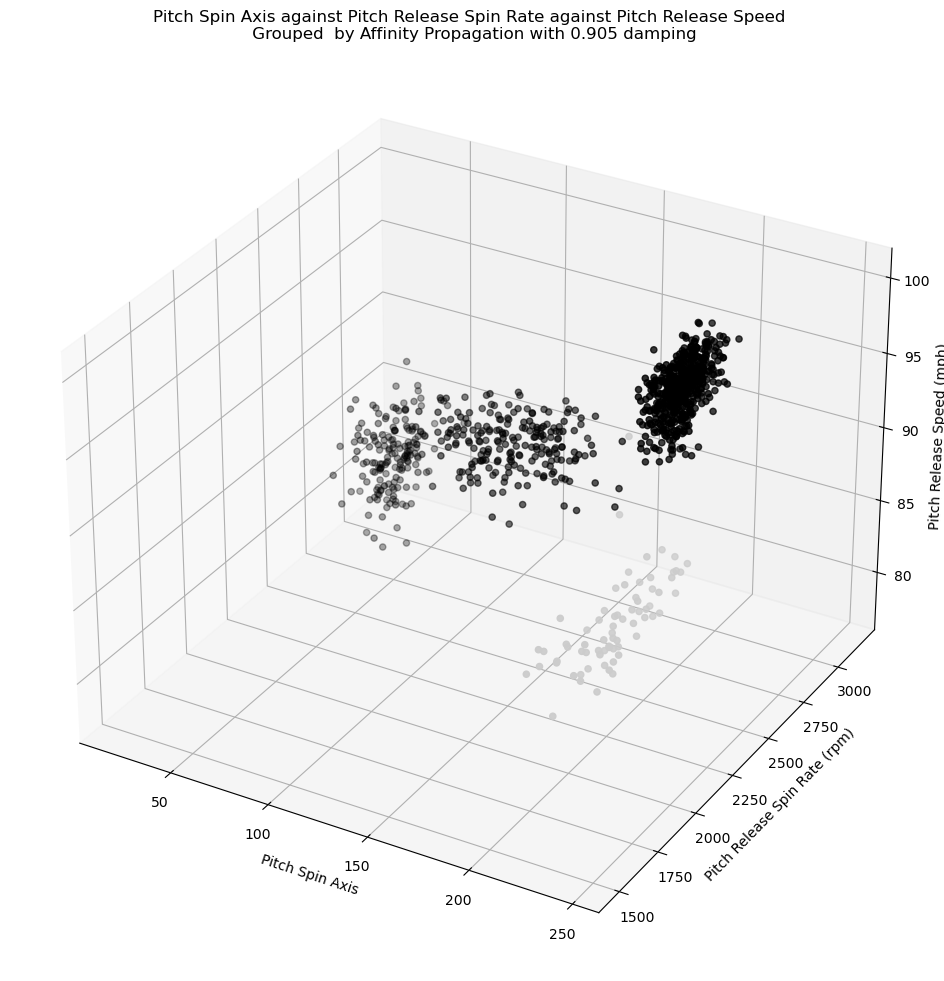

In [165]:
model121 = cluster.AffinityPropagation(damping = 0.905, max_iter = 1000, convergence_iter = 10)
model121.fit(coleTrainX3)

model121ClusterLabels = model121.predict(coleTestX3)

fig = plt.figure()
ax = fig.add_subplot(projection = '3d')
ax.scatter(coleTestX3['spin_axis'], coleTestX3['release_spin_rate'], coleTestX3['release_speed'], c = model121ClusterLabels, cmap = 'nipy_spectral')
ax.set_title(f'Pitch Spin Axis against Pitch Release Spin Rate against Pitch Release Speed \n Grouped  by Affinity Propagation with {0.905} damping')
ax.set_zlabel('Pitch Release Speed (mph)')
ax.set_ylabel('Pitch Release Spin Rate (rpm)')
ax.set_xlabel('Pitch Spin Axis')
fig.set_size_inches(12, 12)
plt.show()

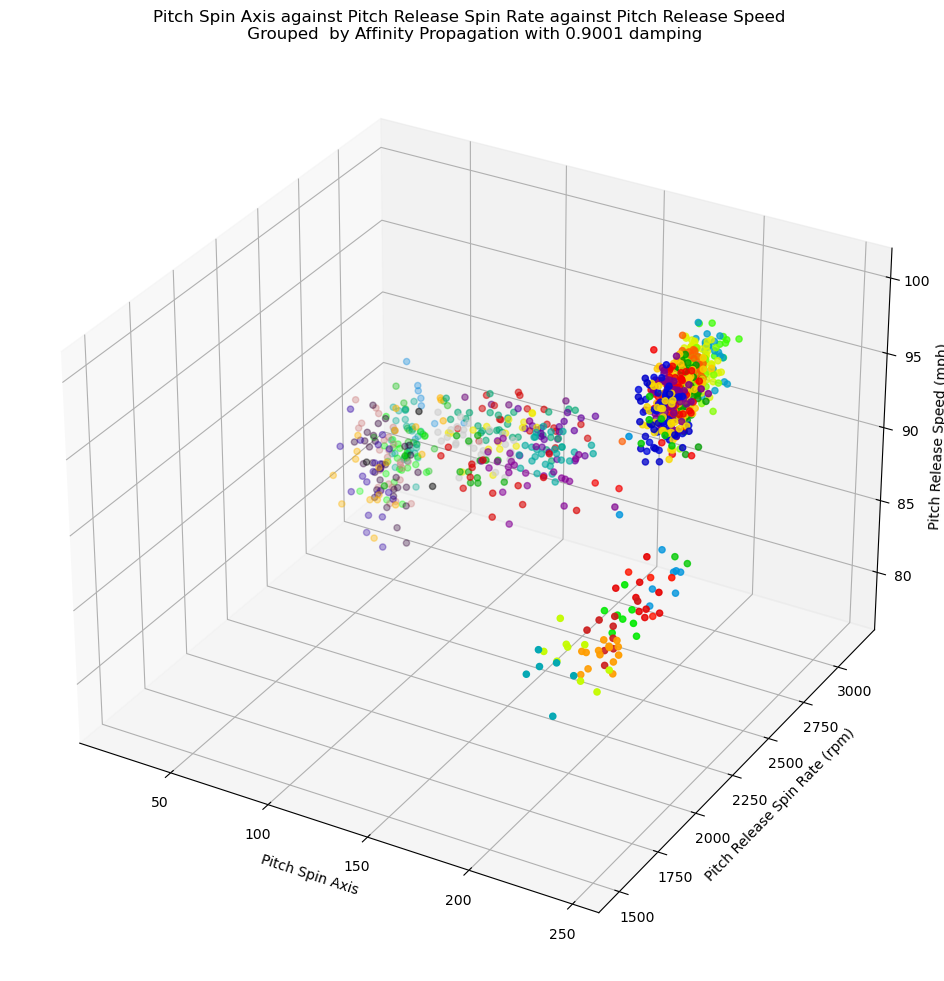

In [166]:
model122 = cluster.AffinityPropagation(damping = 0.9001, max_iter = 1000, convergence_iter = 10)
model122.fit(coleTrainX3)

model122ClusterLabels = model122.predict(coleTestX3)

fig = plt.figure()
ax = fig.add_subplot(projection = '3d')
ax.scatter(coleTestX3['spin_axis'], coleTestX3['release_spin_rate'], coleTestX3['release_speed'], c = model122ClusterLabels, cmap = 'nipy_spectral')
ax.set_title(f'Pitch Spin Axis against Pitch Release Spin Rate against Pitch Release Speed \n Grouped  by Affinity Propagation with {0.9001} damping')
ax.set_zlabel('Pitch Release Speed (mph)')
ax.set_ylabel('Pitch Release Spin Rate (rpm)')
ax.set_xlabel('Pitch Spin Axis')
fig.set_size_inches(12, 12)
plt.show()

The damping trigger point that forms cohesive clusters seems to be around 0.905, after which two clusters are formed.